/tmp/ipykernel_1047713/504210719.py:16: RuntimeWarning: covariance is not positive-semidefinite.
  class_x, class_y = np.random.multivariate_normal(mean, covariance, num_samples).T


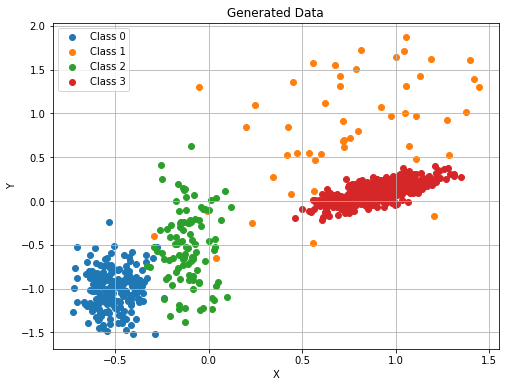

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch

def generate_data(num_samples_per_class, class_means, class_covariances):
    num_classes = len(num_samples_per_class)
    data = []
    labels = []
    
    for i in range(num_classes):
        mean = class_means[i]
        covariance = class_covariances[i]
        num_samples = num_samples_per_class[i]
        
        # Generate data points for the current class
        class_x, class_y = np.random.multivariate_normal(mean, covariance, num_samples).T
        
        # Append the data points and labels
        data.append(np.vstack((class_x, class_y)).T)
        labels.extend([i] * num_samples)
    
    return np.concatenate(data), np.array(labels)

np.random.seed(202)
torch.manual_seed(202)

# Define parameters for each class
num_samples_per_class = [200, 50, 100, 600]
class_means = [[-0.5, -1], [0.7, 0.7],[-0.1, -0.5],[0.9, 0.1]]
class_covariances = [[[0.01, 0], [0, 0.05]], [[0.2, 0.3], [0, 0.2]], [[0.01, 0], [0, 0.2]],[[0.01, 0.01], [0.02, 0.01]]]

# Generate data
data, labels = generate_data(num_samples_per_class, class_means, class_covariances)

# Plot the data
plt.figure(figsize=(8, 6))
for i in range(len(num_samples_per_class)):
    start = sum(num_samples_per_class[:i])
    end = sum(num_samples_per_class[:i+1])
    plt.scatter(data[start:end, 0], data[start:end, 1], label=f'Class {i}')
plt.title('Generated Data')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend()
plt.grid(True)
plt.show()


In [2]:
import torch
from torch.utils.data import TensorDataset

data_tensor = torch.tensor(data, dtype=torch.float32)
labels_tensor = torch.tensor(labels, dtype=torch.long)
dataset = TensorDataset(data_tensor, labels_tensor)

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
from scipy.stats import multivariate_normal
import torch
from io import BytesIO
from PIL import Image

image_bytes_list = []

def plot_normal_distributions_with_dataset(means_tensor, covariances_tensor, epoch, loss, dataset=None):
    num_gaussians = means_tensor.shape[0]

    fig, ax = plt.subplots(figsize=(10, 10))

    # Plot contour lines for each Gaussian distribution
    x = np.linspace(-0.25, 1.25, 100)
    y = np.linspace(-0.25, 1.25, 100)
    X, Y = np.meshgrid(x, y)

    for i in range(num_gaussians):
        mean = means_tensor[i].numpy()
        covariance = covariances_tensor[i].numpy()

        # Calculate probability density function
        pos = np.dstack((X, Y))
        rv = multivariate_normal(mean, covariance)
        Z = rv.pdf(pos)

        # Plot contour lines
        ax.contour(X, Y, Z, levels=5, alpha=0.5)

        # Plot mean point
        ax.plot(mean[0], mean[1], marker='x', markersize=20, markeredgewidth=5, label=fr'$\mathcal{{N}}_{i}$')

        # Plot covariance ellipse
        eigenvalues, eigenvectors = np.linalg.eigh(covariance)
        angle = np.degrees(np.arctan2(eigenvectors[1, 0], eigenvectors[0, 0]))
        width, height = 2 * np.sqrt(2 * eigenvalues)
        ellip = Ellipse(xy=mean, width=width, height=height, angle=angle, alpha=0.3)
        ax.add_patch(ellip)

    # Plot dataset if provided
    if dataset is not None:
        data, labels = dataset.tensors
        data = torch.sigmoid(data)
        
        num_classes = torch.max(labels) + 1
        
        # Create a color map for different classes
        cmap = plt.cm.get_cmap('viridis', num_classes)
        
        # Iterate over each class and scatter plot the data points
        for i in range(num_classes):
            class_indices = (labels == i).nonzero().squeeze()
            plt.scatter(data[class_indices, 0], data[class_indices, 1], c=[cmap(i)], label=f'Class {i}')

    plt.rcParams['axes.titlesize'] = 35
    plt.rcParams['axes.labelsize'] = 35
    #plt.rcParams['xtick.labelsize'] = 25
    #plt.rcParams['ytick.labelsize'] = 25
    ax.set_aspect('equal', 'box')
    ax.set_xlabel('$x_1$')
    ax.set_ylabel('$x_2$')
    ax.set_title('Epoch=%d, L1=%.3f' % (epoch,loss))
    #ax.legend(fontsize=22, loc='lower right')
    ax.grid(True)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    plt.show()
    image_stream = BytesIO()
    plt.savefig(image_stream, format='png')
    plt.close(fig)
    if epoch in [0, 25, 50, 100]:
        fig.savefig('test_{}.pdf'.format(epoch), format='pdf',bbox_inches='tight')
    
    # Append the byte stream to the global list
    image_bytes_list.append(image_stream.getvalue())

def create_gif(output_gif):
    images = [Image.open(BytesIO(image_bytes)) for image_bytes in image_bytes_list]
    gif_duration = 1000  # milliseconds
    images[0].save(output_gif, save_all=True, append_images=images[1:], optimize=False, duration=gif_duration, loop=0)


Means:
Parameter containing:
tensor([[0.6282, 0.7710],
        [0.5404, 0.5480],
        [0.0920, 0.3038]], requires_grad=True)
Using training set as validation set for early stopping
Using device cpu
[test_gmnet_2D] Starting epoch 0...
[test_gmnet_2D] Elapsed training time:1.09s
Means:
Parameter containing:
tensor([[0.6221, 0.8080],
        [0.5001, 0.5082],
        [0.0926, 0.2711]], requires_grad=True)


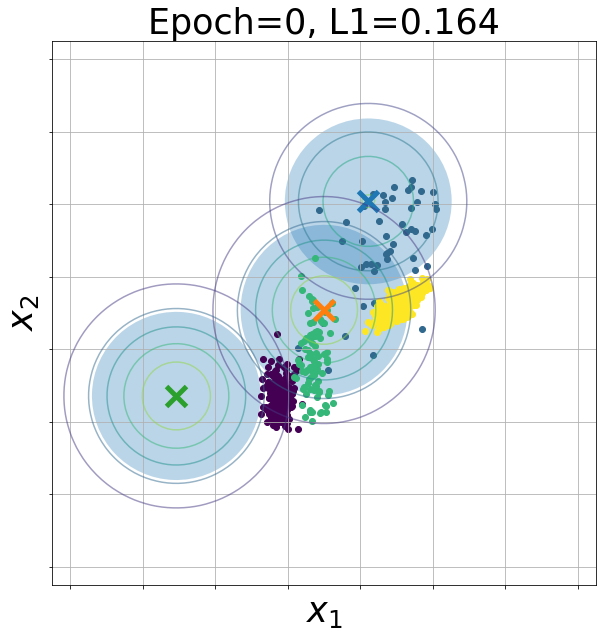

[test_gmnet_2D] [Epoch=000] Train Loss=[QuantLoss=0.16384]Val loss = [QuantLoss=0.16384][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 1...
[test_gmnet_2D] Elapsed training time:0.37s
Means:
Parameter containing:
tensor([[0.6289, 0.8369],
        [0.4545, 0.4519],
        [0.1257, 0.2715]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

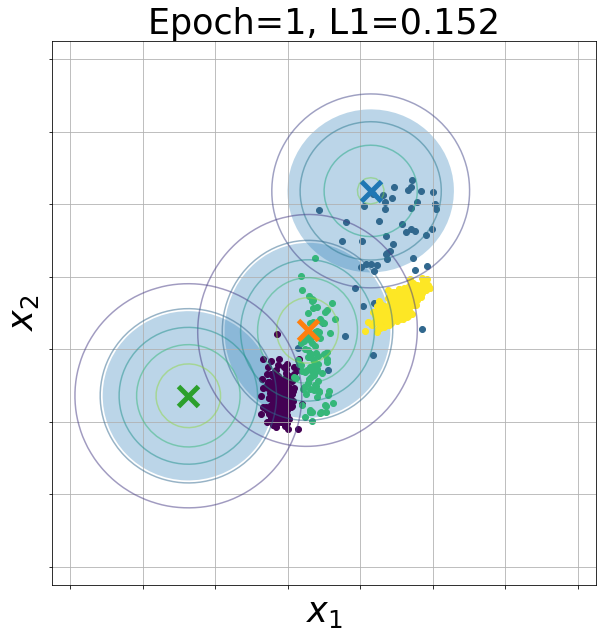

[test_gmnet_2D] [Epoch=001] Train Loss=[QuantLoss=0.15238]Val loss = [QuantLoss=0.15238][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 2...
[test_gmnet_2D] Elapsed training time:0.44s
Means:
Parameter containing:
tensor([[0.6363, 0.8439],
        [0.4302, 0.4092],
        [0.1454, 0.2635]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

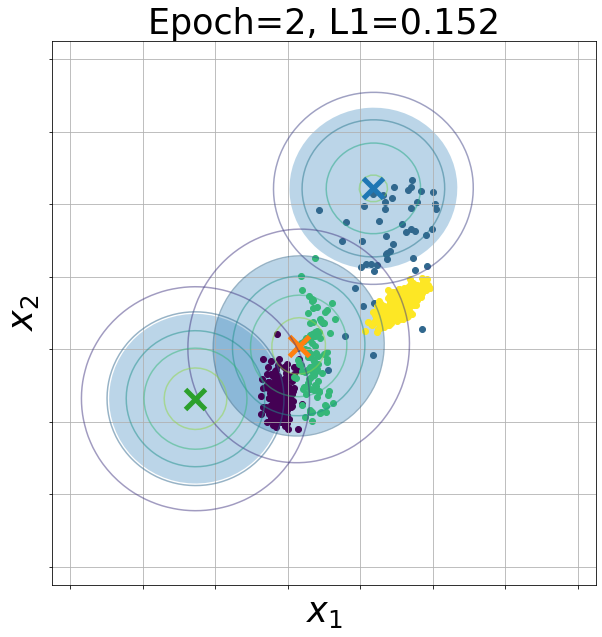

[test_gmnet_2D] [Epoch=002] Train Loss=[QuantLoss=0.15166]Val loss = [QuantLoss=0.15166][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 3...
[test_gmnet_2D] Elapsed training time:0.33s
Means:
Parameter containing:
tensor([[0.6314, 0.8602],
        [0.4249, 0.3857],
        [0.1320, 0.2397]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

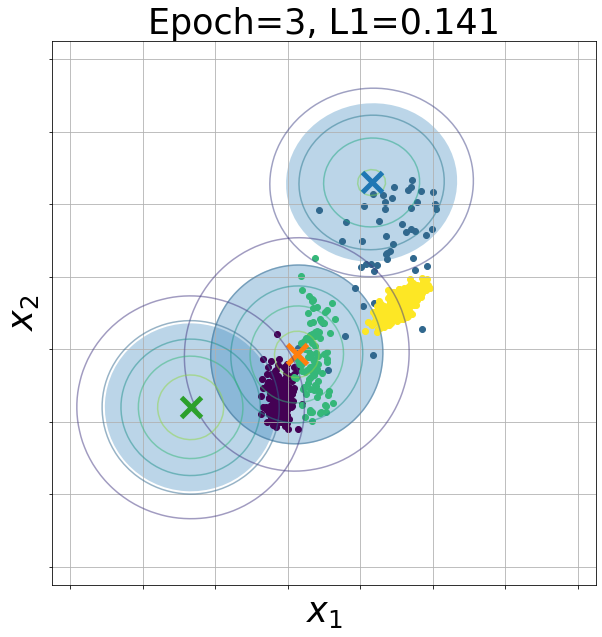

[test_gmnet_2D] [Epoch=003] Train Loss=[QuantLoss=0.14105]Val loss = [QuantLoss=0.14105][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 4...
[test_gmnet_2D] Elapsed training time:0.33s
Means:
Parameter containing:
tensor([[0.6145, 0.8681],
        [0.4230, 0.3654],
        [0.1079, 0.2140]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

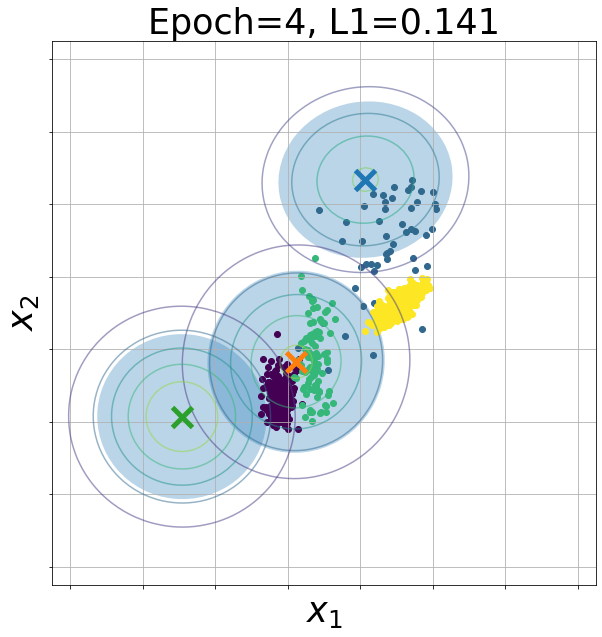

[test_gmnet_2D] [Epoch=004] Train Loss=[QuantLoss=0.14123]Val loss = [QuantLoss=0.14123]
[test_gmnet_2D] Starting epoch 5...
[test_gmnet_2D] Elapsed training time:0.60s
Means:
Parameter containing:
tensor([[0.6197, 0.8698],
        [0.4110, 0.3477],
        [0.0908, 0.2157]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

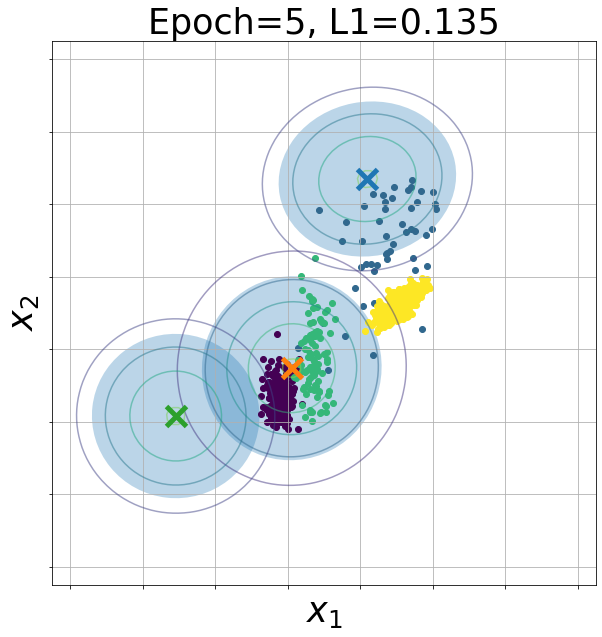

[test_gmnet_2D] [Epoch=005] Train Loss=[QuantLoss=0.13451]Val loss = [QuantLoss=0.13451][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 6...
[test_gmnet_2D] Elapsed training time:0.38s
Means:
Parameter containing:
tensor([[0.6207, 0.8672],
        [0.4080, 0.3319],
        [0.0778, 0.2009]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

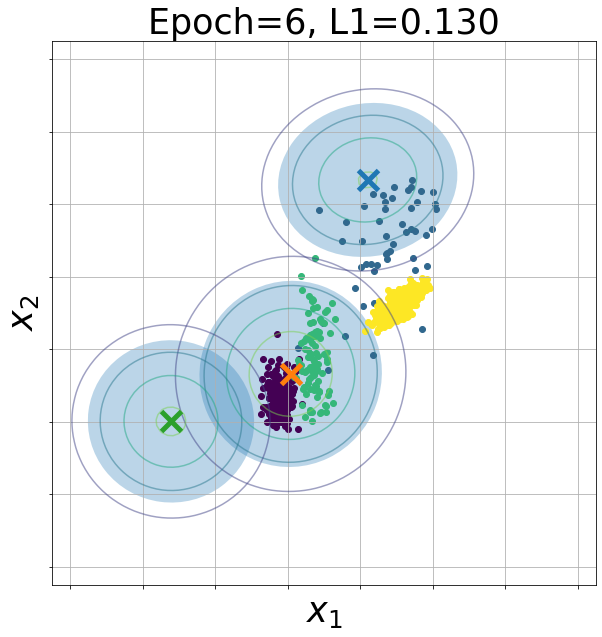

[test_gmnet_2D] [Epoch=006] Train Loss=[QuantLoss=0.12977]Val loss = [QuantLoss=0.12977][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 7...
[test_gmnet_2D] Elapsed training time:0.41s
Means:
Parameter containing:
tensor([[0.6360, 0.8624],
        [0.3986, 0.3169],
        [0.0583, 0.1971]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

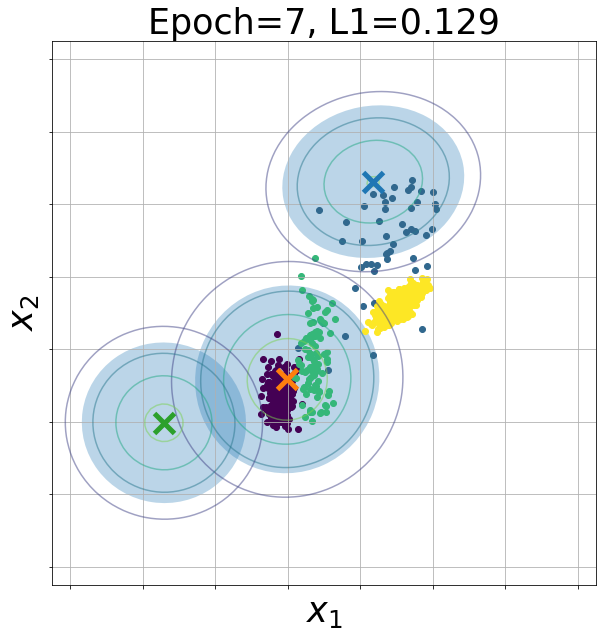

[test_gmnet_2D] [Epoch=007] Train Loss=[QuantLoss=0.12904]Val loss = [QuantLoss=0.12904][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 8...
[test_gmnet_2D] Elapsed training time:0.39s
Means:
Parameter containing:
tensor([[0.6321, 0.8685],
        [0.3954, 0.3088],
        [0.0301, 0.1938]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

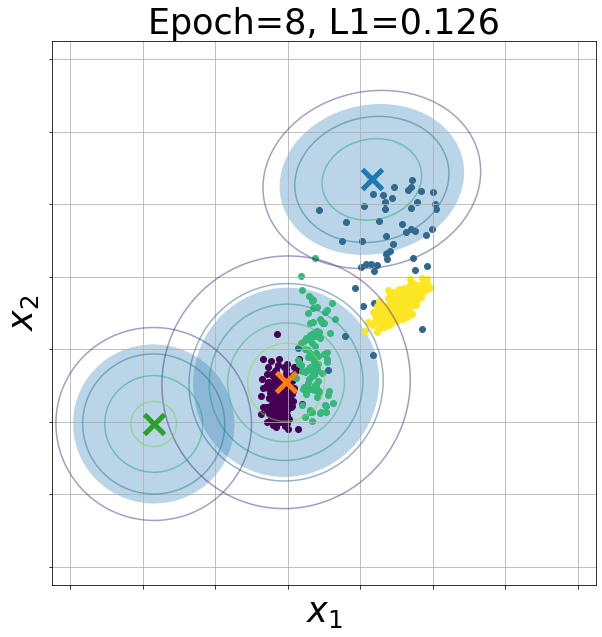

[test_gmnet_2D] [Epoch=008] Train Loss=[QuantLoss=0.12588]Val loss = [QuantLoss=0.12588][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 9...
[test_gmnet_2D] Elapsed training time:0.38s
Means:
Parameter containing:
tensor([[0.6406, 0.8622],
        [0.3908, 0.2992],
        [0.0204, 0.1982]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

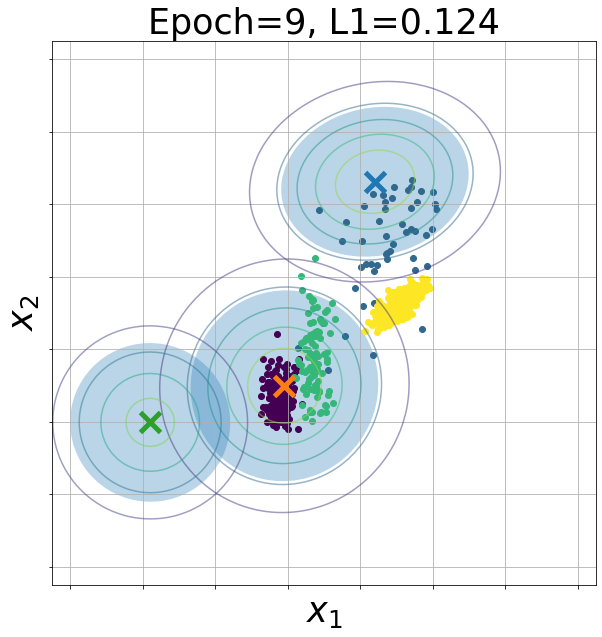

[test_gmnet_2D] [Epoch=009] Train Loss=[QuantLoss=0.12408]Val loss = [QuantLoss=0.12408][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 10...
[test_gmnet_2D] Elapsed training time:0.41s
Means:
Parameter containing:
tensor([[0.6365, 0.8677],
        [0.3803, 0.2848],
        [0.0080, 0.1921]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

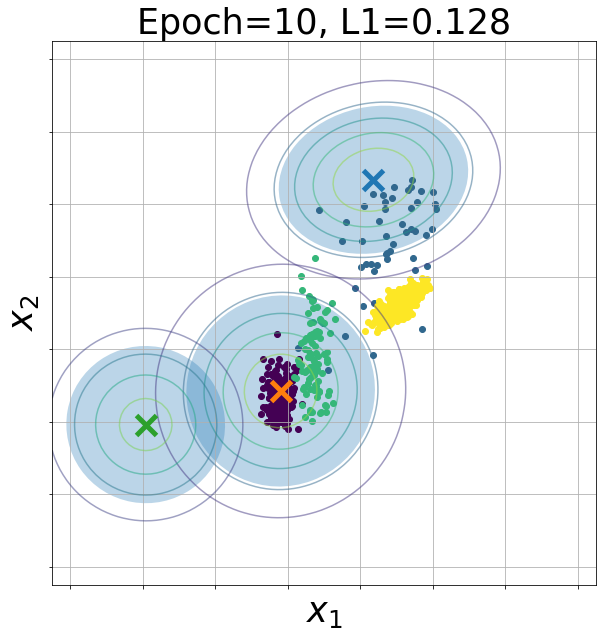

[test_gmnet_2D] [Epoch=010] Train Loss=[QuantLoss=0.12832]Val loss = [QuantLoss=0.12832]
[test_gmnet_2D] Starting epoch 11...
[test_gmnet_2D] Elapsed training time:0.43s
Means:
Parameter containing:
tensor([[ 0.6367,  0.8640],
        [ 0.3801,  0.2803],
        [-0.0044,  0.1928]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

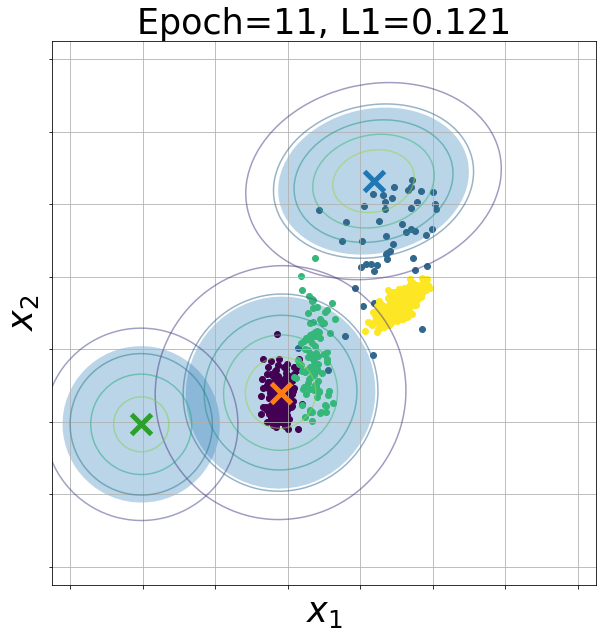

[test_gmnet_2D] [Epoch=011] Train Loss=[QuantLoss=0.12144]Val loss = [QuantLoss=0.12144][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 12...
[test_gmnet_2D] Elapsed training time:0.39s
Means:
Parameter containing:
tensor([[ 0.6252,  0.8614],
        [ 0.3712,  0.2701],
        [-0.0177,  0.1978]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

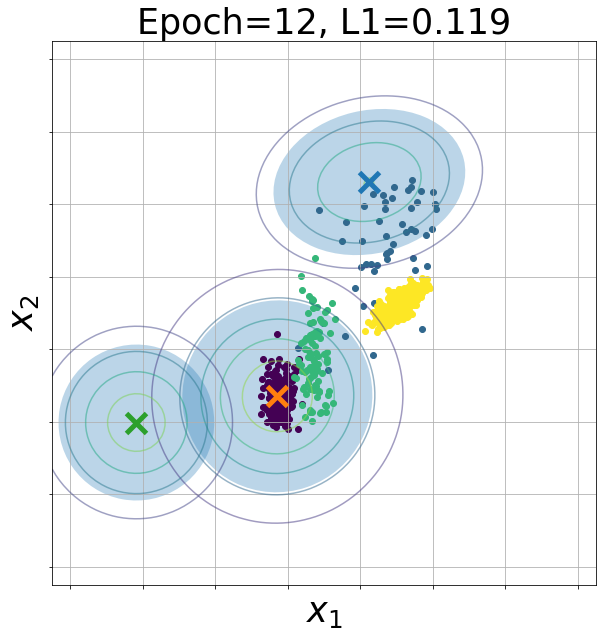

[test_gmnet_2D] [Epoch=012] Train Loss=[QuantLoss=0.11873]Val loss = [QuantLoss=0.11873][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 13...
[test_gmnet_2D] Elapsed training time:0.39s
Means:
Parameter containing:
tensor([[ 0.6330,  0.8690],
        [ 0.3650,  0.2629],
        [-0.0081,  0.1966]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

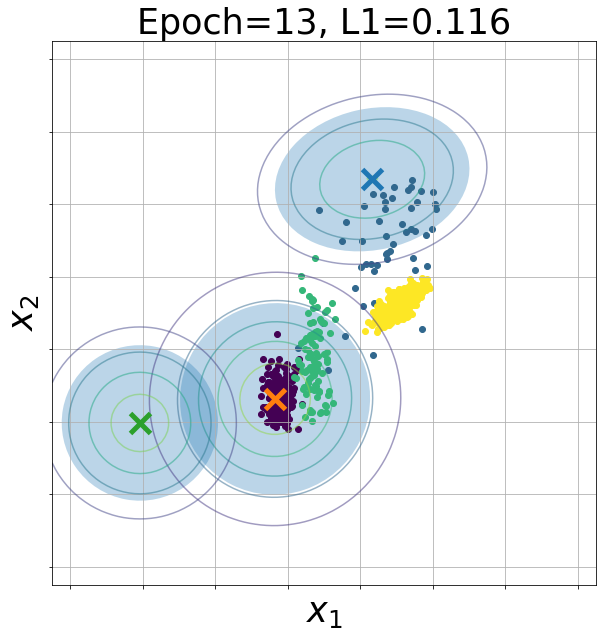

[test_gmnet_2D] [Epoch=013] Train Loss=[QuantLoss=0.11603]Val loss = [QuantLoss=0.11603][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 14...
[test_gmnet_2D] Elapsed training time:0.38s
Means:
Parameter containing:
tensor([[ 0.6413,  0.8545],
        [ 0.3676,  0.2599],
        [-0.0165,  0.1830]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

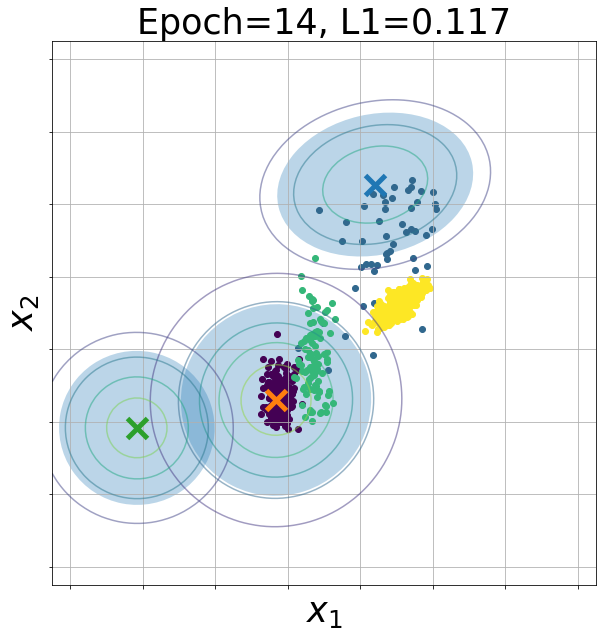

[test_gmnet_2D] [Epoch=014] Train Loss=[QuantLoss=0.11718]Val loss = [QuantLoss=0.11718]
[test_gmnet_2D] Starting epoch 15...
[test_gmnet_2D] Elapsed training time:0.37s
Means:
Parameter containing:
tensor([[ 0.6319,  0.8576],
        [ 0.3586,  0.2556],
        [-0.0112,  0.1908]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

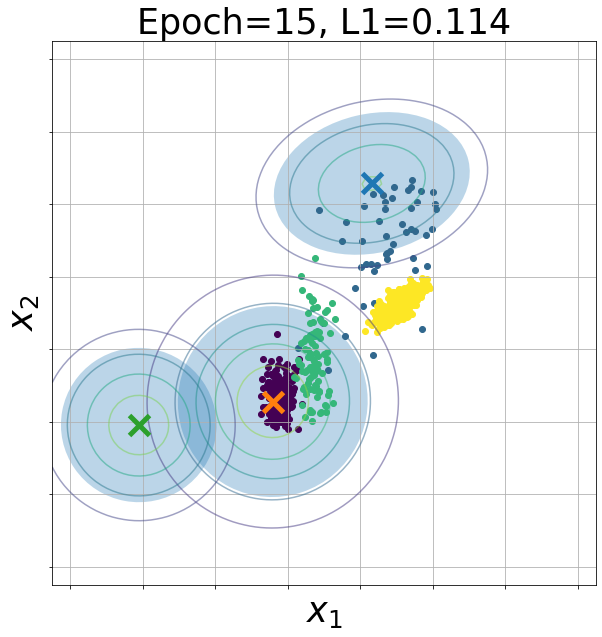

[test_gmnet_2D] [Epoch=015] Train Loss=[QuantLoss=0.11388]Val loss = [QuantLoss=0.11388][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 16...
[test_gmnet_2D] Elapsed training time:0.50s
Means:
Parameter containing:
tensor([[ 0.6181,  0.8554],
        [ 0.3604,  0.2544],
        [-0.0144,  0.1888]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

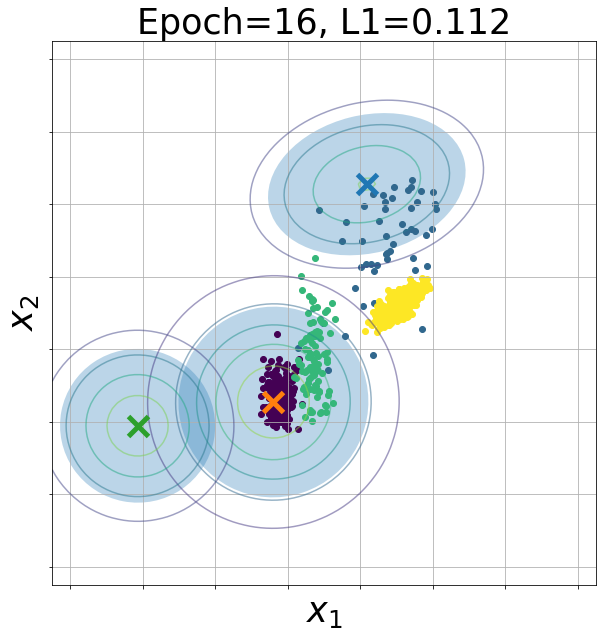

[test_gmnet_2D] [Epoch=016] Train Loss=[QuantLoss=0.11215]Val loss = [QuantLoss=0.11215][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 17...
[test_gmnet_2D] Elapsed training time:0.38s
Means:
Parameter containing:
tensor([[ 0.6074,  0.8471],
        [ 0.3600,  0.2513],
        [-0.0070,  0.1840]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

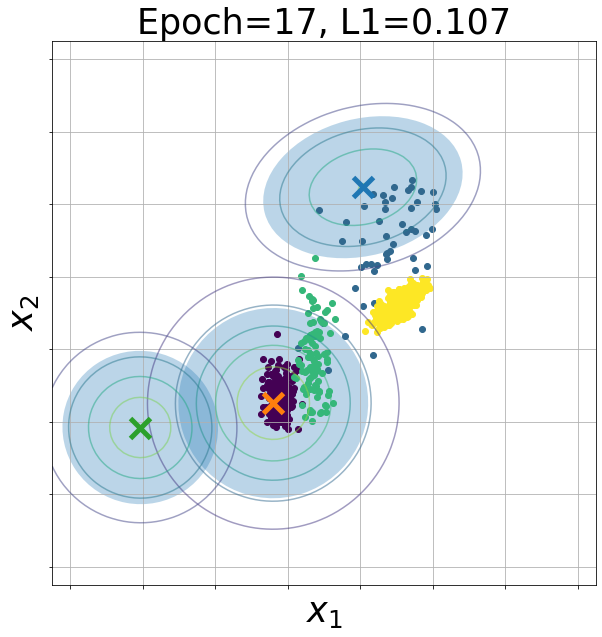

[test_gmnet_2D] [Epoch=017] Train Loss=[QuantLoss=0.10686]Val loss = [QuantLoss=0.10686][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 18...
[test_gmnet_2D] Elapsed training time:0.44s
Means:
Parameter containing:
tensor([[ 0.6117,  0.8533],
        [ 0.3634,  0.2541],
        [-0.0048,  0.1927]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

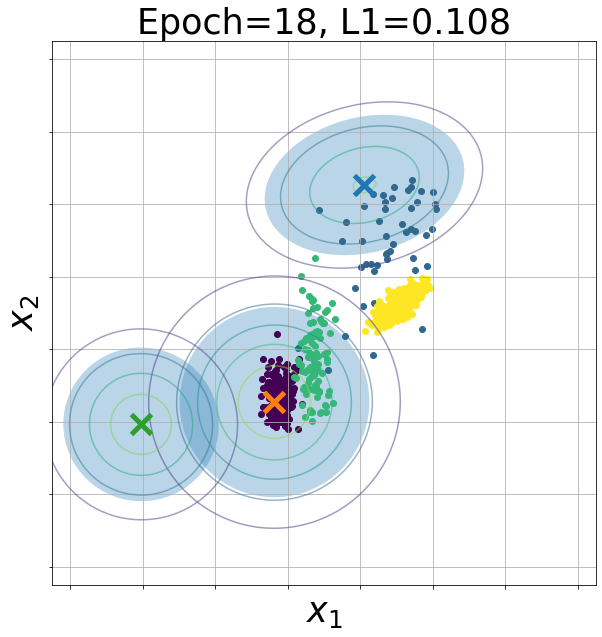

[test_gmnet_2D] [Epoch=018] Train Loss=[QuantLoss=0.10802]Val loss = [QuantLoss=0.10802]
[test_gmnet_2D] Starting epoch 19...
[test_gmnet_2D] Elapsed training time:0.41s
Means:
Parameter containing:
tensor([[ 0.6184,  0.8397],
        [ 0.3681,  0.2590],
        [-0.0046,  0.2018]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

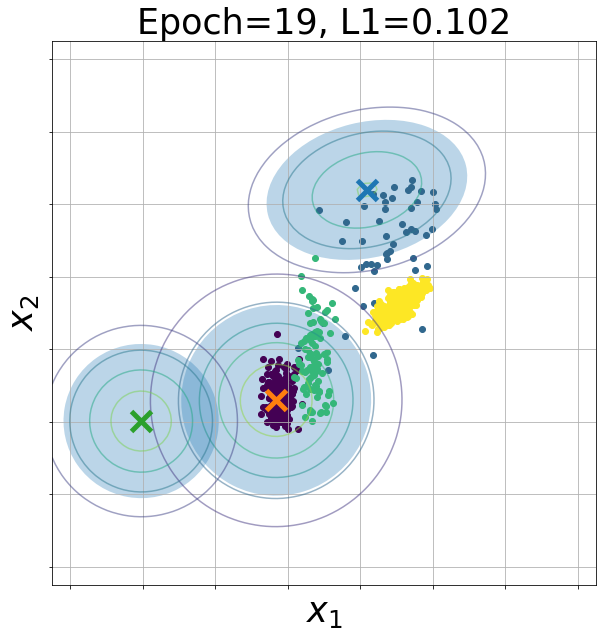

[test_gmnet_2D] [Epoch=019] Train Loss=[QuantLoss=0.10177]Val loss = [QuantLoss=0.10177][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 20...
[test_gmnet_2D] Elapsed training time:0.43s
Means:
Parameter containing:
tensor([[ 0.6279,  0.8342],
        [ 0.3745,  0.2649],
        [-0.0036,  0.2107]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

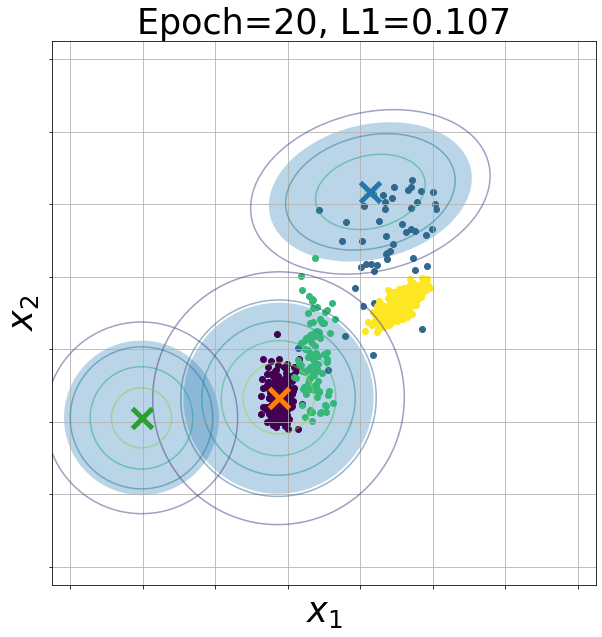

[test_gmnet_2D] [Epoch=020] Train Loss=[QuantLoss=0.10670]Val loss = [QuantLoss=0.10670]
[test_gmnet_2D] Starting epoch 21...
[test_gmnet_2D] Elapsed training time:0.40s
Means:
Parameter containing:
tensor([[ 0.6334,  0.8242],
        [ 0.3768,  0.2698],
        [-0.0031,  0.2172]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

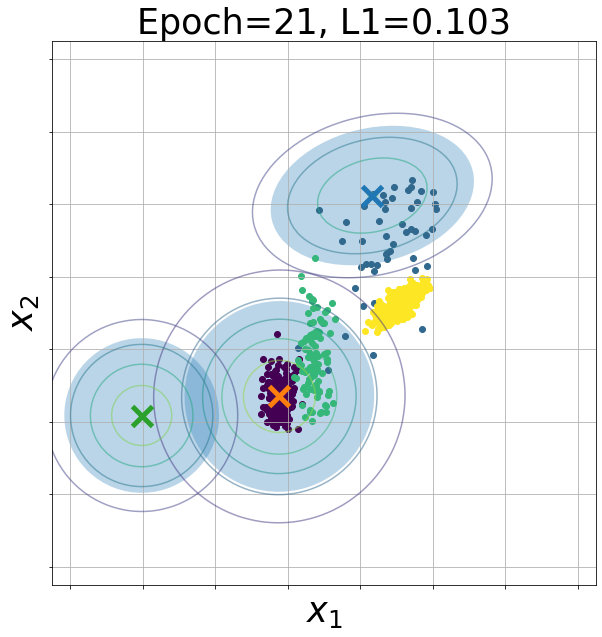

[test_gmnet_2D] [Epoch=021] Train Loss=[QuantLoss=0.10301]Val loss = [QuantLoss=0.10301]
[test_gmnet_2D] Starting epoch 22...
[test_gmnet_2D] Elapsed training time:0.65s
Means:
Parameter containing:
tensor([[0.6327, 0.8154],
        [0.3868, 0.2789],
        [0.0019, 0.2199]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

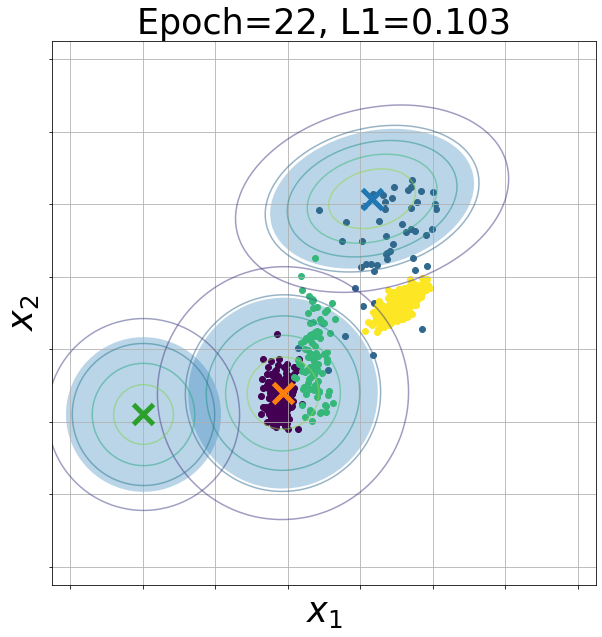

[test_gmnet_2D] [Epoch=022] Train Loss=[QuantLoss=0.10266]Val loss = [QuantLoss=0.10266]
[test_gmnet_2D] Starting epoch 23...
[test_gmnet_2D] Elapsed training time:0.34s
Means:
Parameter containing:
tensor([[0.6371, 0.8170],
        [0.3889, 0.2865],
        [0.0039, 0.2203]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

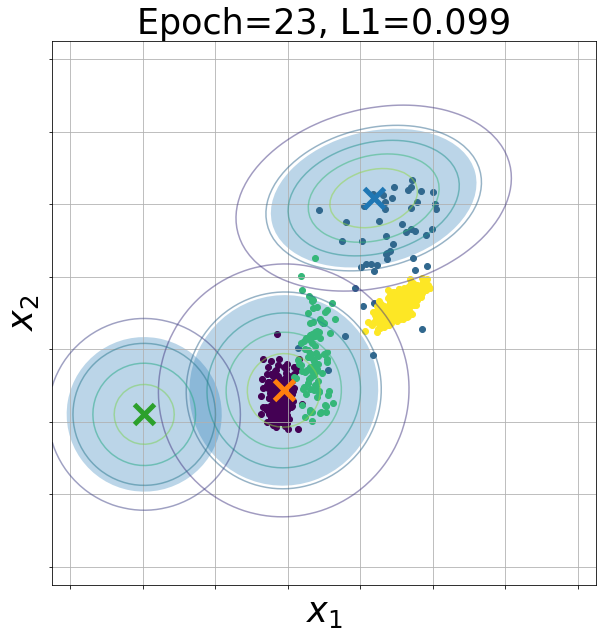

[test_gmnet_2D] [Epoch=023] Train Loss=[QuantLoss=0.09913]Val loss = [QuantLoss=0.09913][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 24...
[test_gmnet_2D] Elapsed training time:0.54s
Means:
Parameter containing:
tensor([[ 0.6484,  0.8060],
        [ 0.3894,  0.2945],
        [-0.0017,  0.2145]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

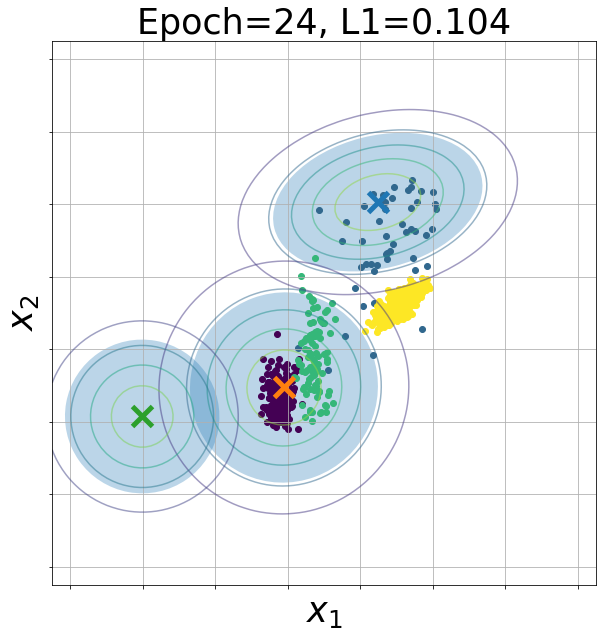

[test_gmnet_2D] [Epoch=024] Train Loss=[QuantLoss=0.10399]Val loss = [QuantLoss=0.10399]
[test_gmnet_2D] Starting epoch 25...
[test_gmnet_2D] Elapsed training time:0.31s
Means:
Parameter containing:
tensor([[ 0.6634,  0.7848],
        [ 0.3973,  0.3117],
        [-0.0132,  0.2113]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

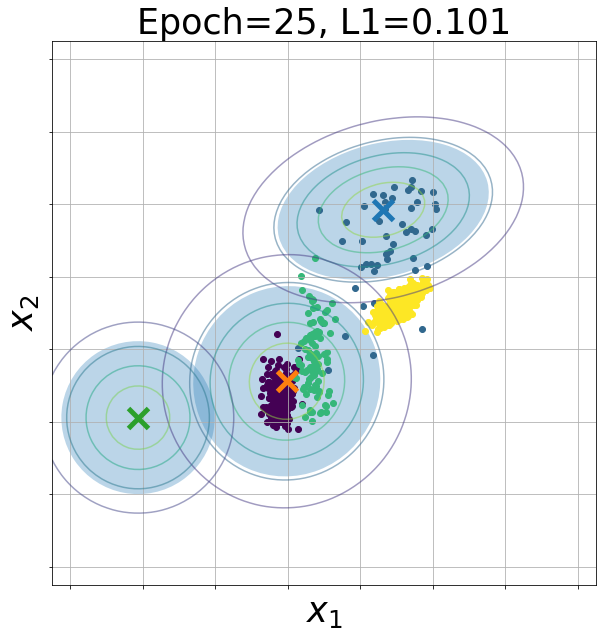

[test_gmnet_2D] [Epoch=025] Train Loss=[QuantLoss=0.10130]Val loss = [QuantLoss=0.10130]
[test_gmnet_2D] Starting epoch 26...
[test_gmnet_2D] Elapsed training time:0.29s
Means:
Parameter containing:
tensor([[ 0.6661,  0.7905],
        [ 0.3912,  0.3141],
        [-0.0035,  0.2200]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

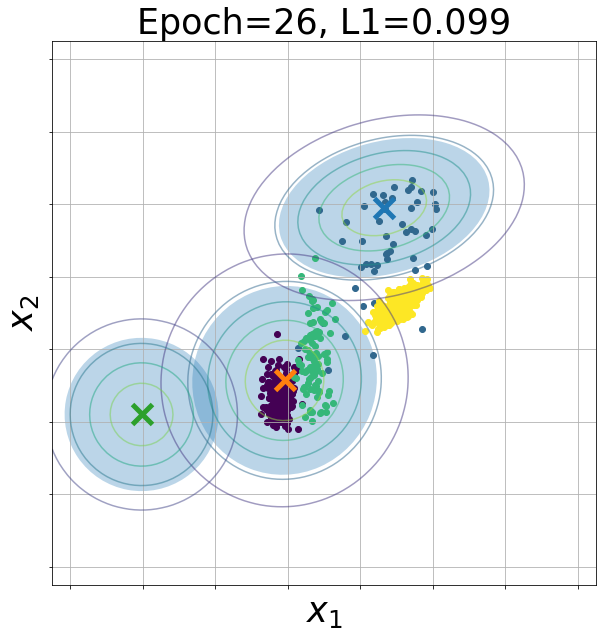

[test_gmnet_2D] [Epoch=026] Train Loss=[QuantLoss=0.09934]Val loss = [QuantLoss=0.09934]
[test_gmnet_2D] Starting epoch 27...
[test_gmnet_2D] Elapsed training time:0.30s
Means:
Parameter containing:
tensor([[0.6420, 0.7974],
        [0.4010, 0.3310],
        [0.0048, 0.2233]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

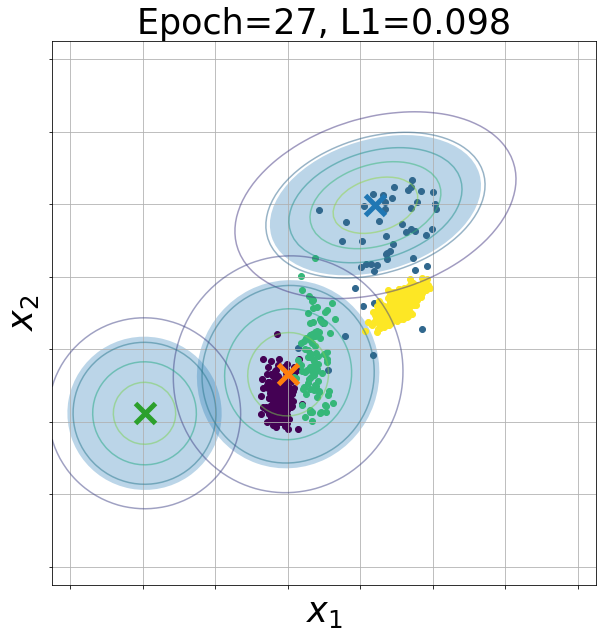

[test_gmnet_2D] [Epoch=027] Train Loss=[QuantLoss=0.09779]Val loss = [QuantLoss=0.09779][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 28...
[test_gmnet_2D] Elapsed training time:0.35s
Means:
Parameter containing:
tensor([[0.6334, 0.7775],
        [0.4156, 0.3586],
        [0.0078, 0.2154]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

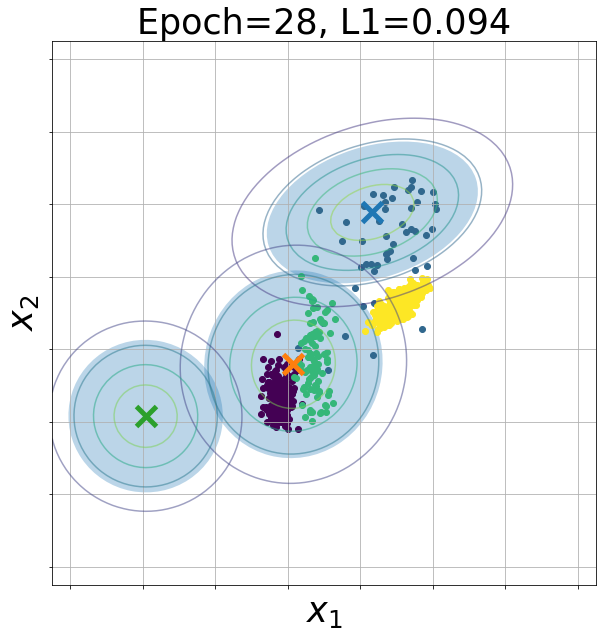

[test_gmnet_2D] [Epoch=028] Train Loss=[QuantLoss=0.09408]Val loss = [QuantLoss=0.09408][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 29...
[test_gmnet_2D] Elapsed training time:0.40s
Means:
Parameter containing:
tensor([[0.6352, 0.7802],
        [0.4170, 0.3736],
        [0.0089, 0.1996]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

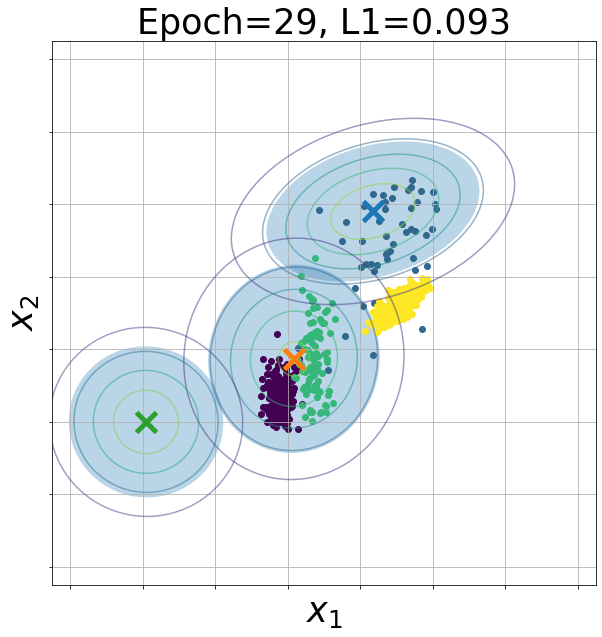

[test_gmnet_2D] [Epoch=029] Train Loss=[QuantLoss=0.09264]Val loss = [QuantLoss=0.09264][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 30...
[test_gmnet_2D] Elapsed training time:0.42s
Means:
Parameter containing:
tensor([[0.6467, 0.7751],
        [0.4214, 0.3873],
        [0.0087, 0.2023]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

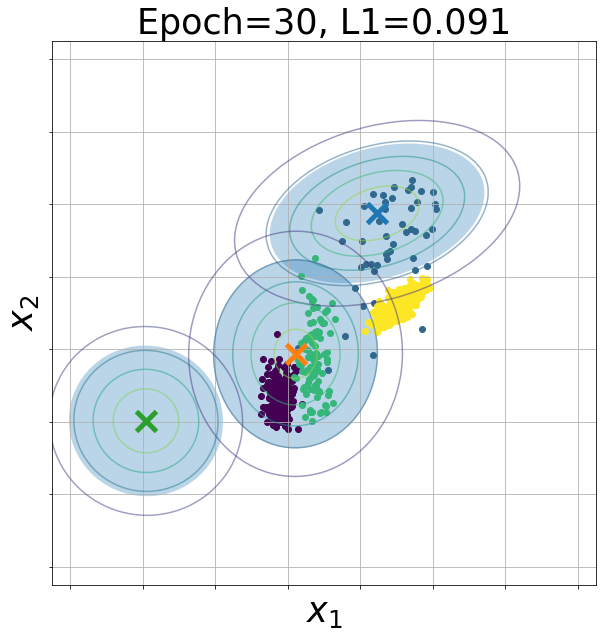

[test_gmnet_2D] [Epoch=030] Train Loss=[QuantLoss=0.09098]Val loss = [QuantLoss=0.09098][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 31...
[test_gmnet_2D] Elapsed training time:0.33s
Means:
Parameter containing:
tensor([[ 6.4630e-01,  7.6919e-01],
        [ 4.1655e-01,  4.0085e-01],
        [-7.0209e-04,  1.9173e-01]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

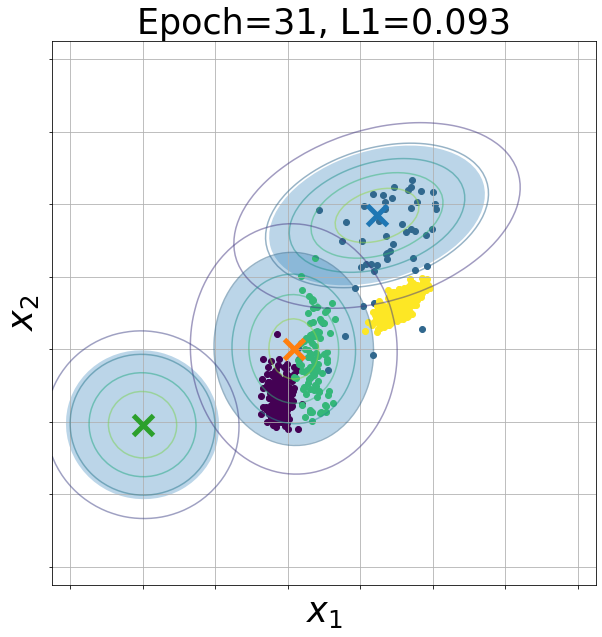

[test_gmnet_2D] [Epoch=031] Train Loss=[QuantLoss=0.09344]Val loss = [QuantLoss=0.09344]
[test_gmnet_2D] Starting epoch 32...
[test_gmnet_2D] Elapsed training time:0.33s
Means:
Parameter containing:
tensor([[0.6457, 0.7726],
        [0.4434, 0.4240],
        [0.0133, 0.1890]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

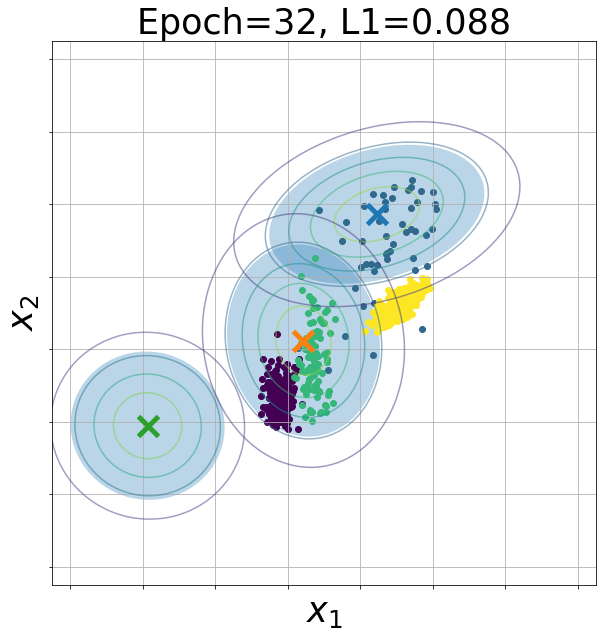

[test_gmnet_2D] [Epoch=032] Train Loss=[QuantLoss=0.08803]Val loss = [QuantLoss=0.08803][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 33...
[test_gmnet_2D] Elapsed training time:0.35s
Means:
Parameter containing:
tensor([[0.6451, 0.7691],
        [0.4361, 0.4177],
        [0.0107, 0.1854]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

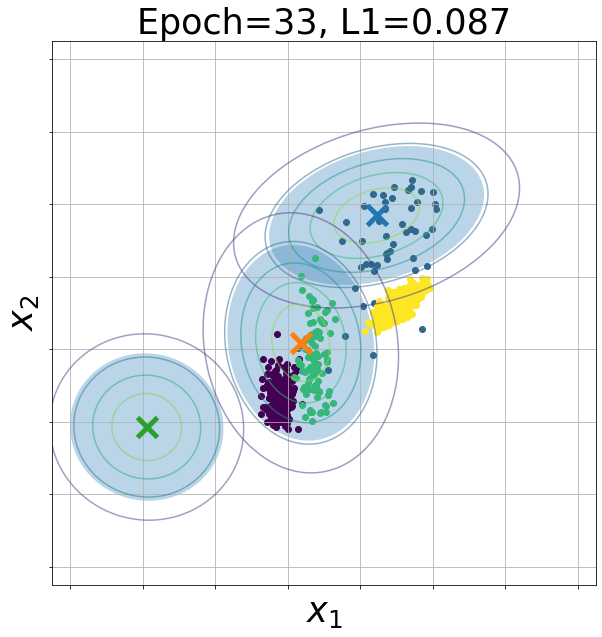

[test_gmnet_2D] [Epoch=033] Train Loss=[QuantLoss=0.08651]Val loss = [QuantLoss=0.08651][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 34...
[test_gmnet_2D] Elapsed training time:0.51s
Means:
Parameter containing:
tensor([[0.6480, 0.7716],
        [0.4425, 0.4243],
        [0.0084, 0.1904]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

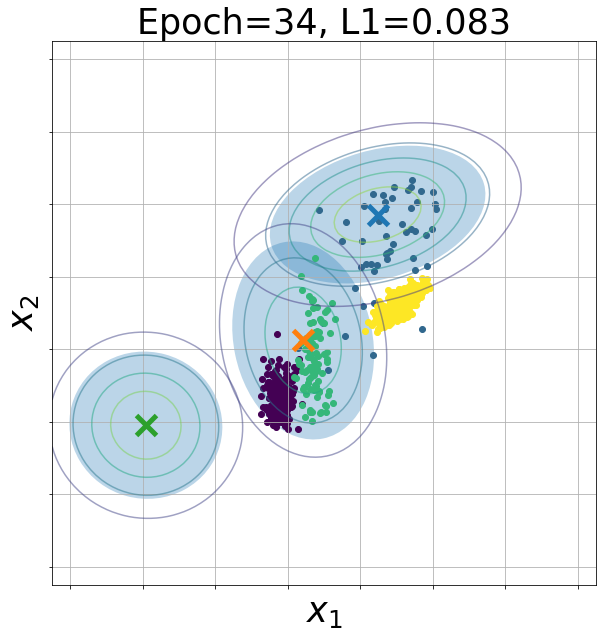

[test_gmnet_2D] [Epoch=034] Train Loss=[QuantLoss=0.08337]Val loss = [QuantLoss=0.08337][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 35...
[test_gmnet_2D] Elapsed training time:0.62s
Means:
Parameter containing:
tensor([[0.6533, 0.7730],
        [0.4460, 0.4277],
        [0.0030, 0.1887]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

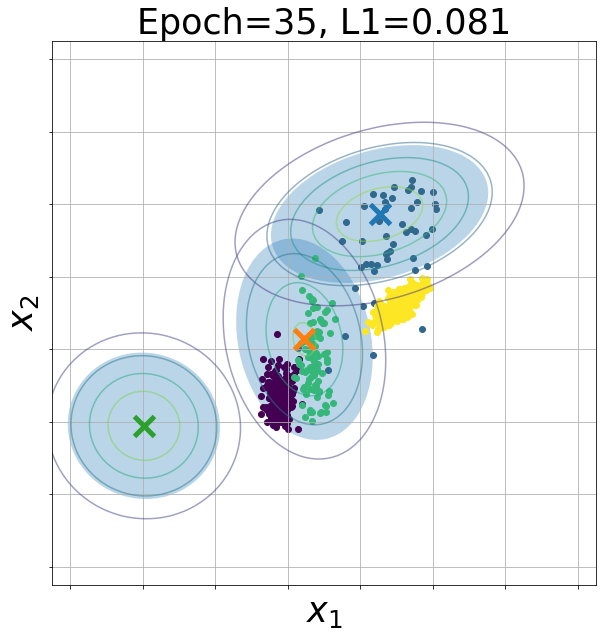

[test_gmnet_2D] [Epoch=035] Train Loss=[QuantLoss=0.08086]Val loss = [QuantLoss=0.08086][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 36...
[test_gmnet_2D] Elapsed training time:0.37s
Means:
Parameter containing:
tensor([[0.6621, 0.7739],
        [0.4483, 0.4299],
        [0.0074, 0.1962]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

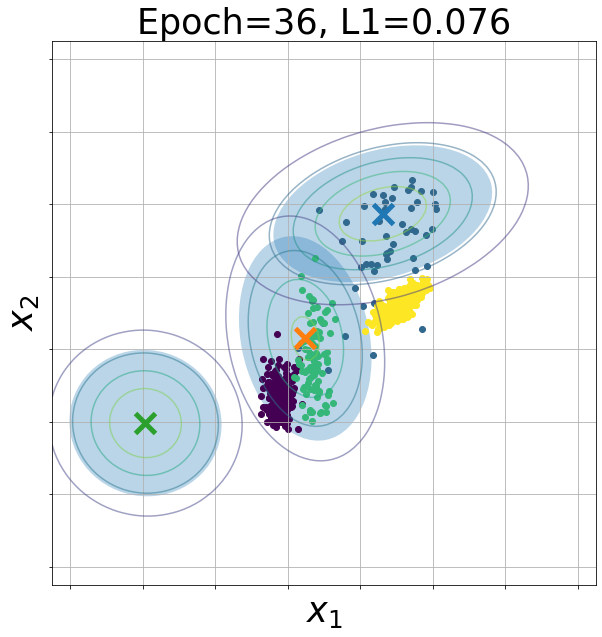

[test_gmnet_2D] [Epoch=036] Train Loss=[QuantLoss=0.07614]Val loss = [QuantLoss=0.07614][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 37...
[test_gmnet_2D] Elapsed training time:0.61s
Means:
Parameter containing:
tensor([[0.6650, 0.7750],
        [0.4490, 0.4275],
        [0.0097, 0.2040]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

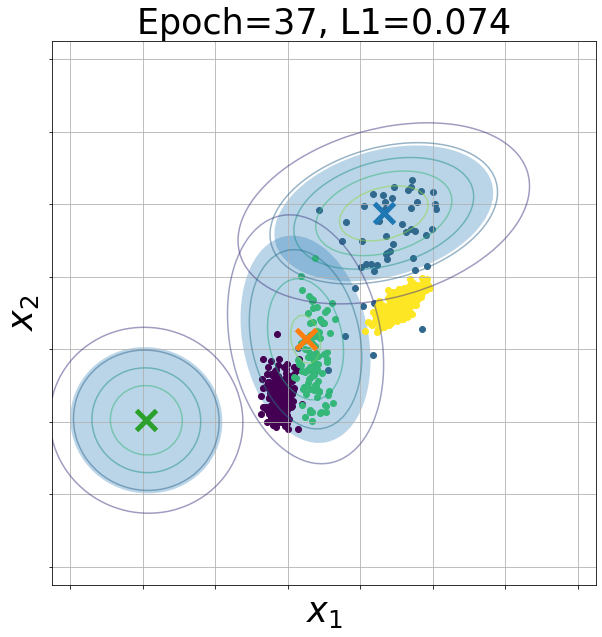

[test_gmnet_2D] [Epoch=037] Train Loss=[QuantLoss=0.07418]Val loss = [QuantLoss=0.07418][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 38...
[test_gmnet_2D] Elapsed training time:0.31s
Means:
Parameter containing:
tensor([[0.6690, 0.7811],
        [0.4492, 0.4260],
        [0.0210, 0.2146]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

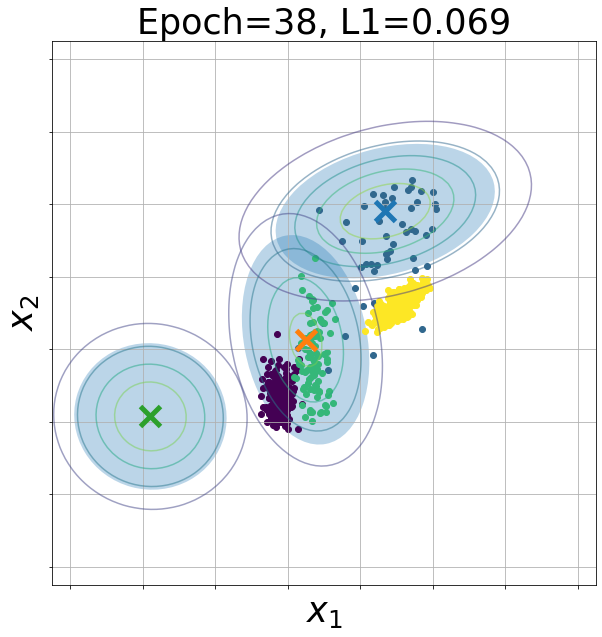

[test_gmnet_2D] [Epoch=038] Train Loss=[QuantLoss=0.06901]Val loss = [QuantLoss=0.06901][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 39...
[test_gmnet_2D] Elapsed training time:0.39s
Means:
Parameter containing:
tensor([[0.6682, 0.7705],
        [0.4533, 0.4310],
        [0.0197, 0.2135]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

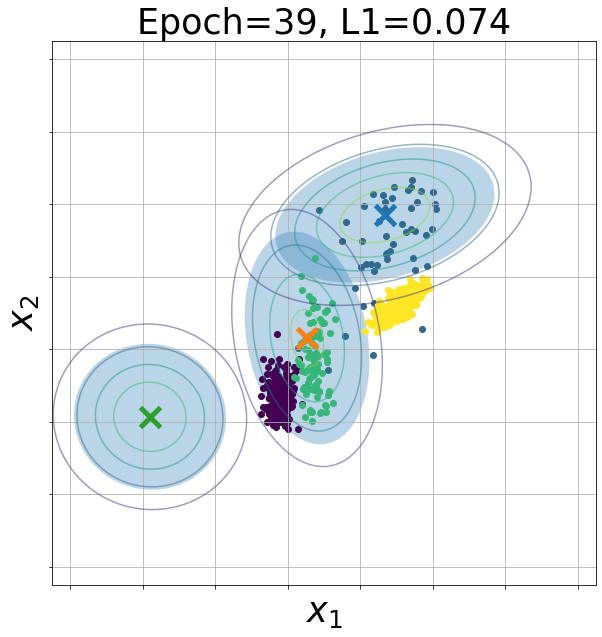

[test_gmnet_2D] [Epoch=039] Train Loss=[QuantLoss=0.07354]Val loss = [QuantLoss=0.07354]
[test_gmnet_2D] Starting epoch 40...
[test_gmnet_2D] Elapsed training time:2.27s
Means:
Parameter containing:
tensor([[0.6717, 0.7685],
        [0.4426, 0.4214],
        [0.0244, 0.2212]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

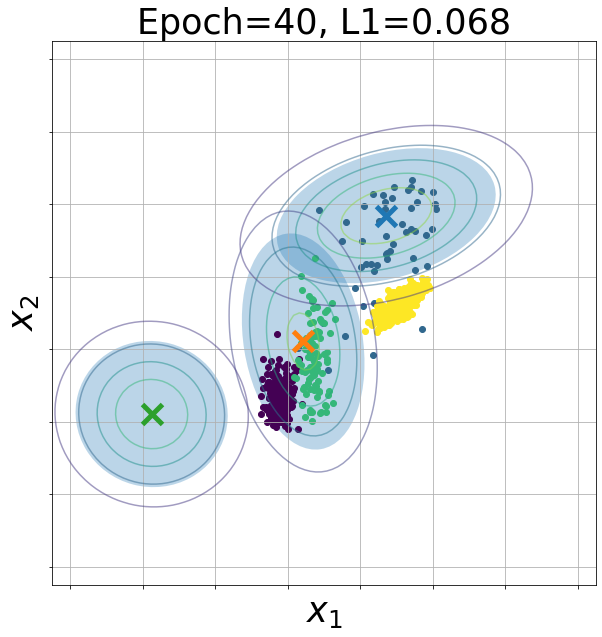

[test_gmnet_2D] [Epoch=040] Train Loss=[QuantLoss=0.06799]Val loss = [QuantLoss=0.06799][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 41...
[test_gmnet_2D] Elapsed training time:0.39s
Means:
Parameter containing:
tensor([[0.6774, 0.7689],
        [0.4467, 0.4229],
        [0.0273, 0.2295]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

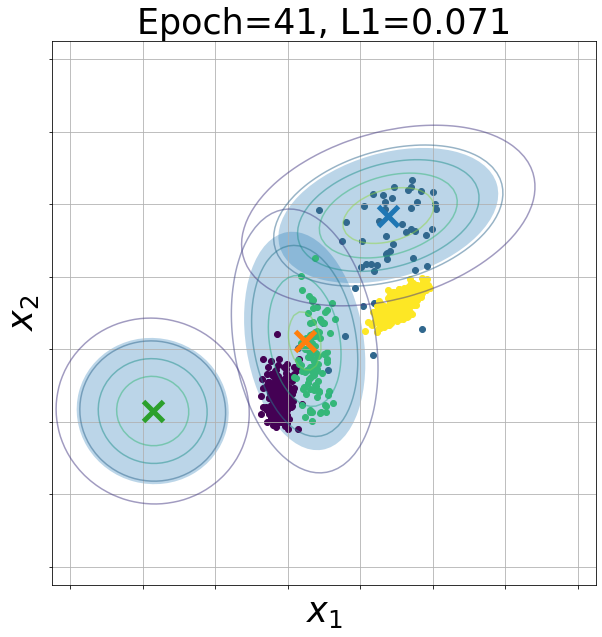

[test_gmnet_2D] [Epoch=041] Train Loss=[QuantLoss=0.07060]Val loss = [QuantLoss=0.07060]
[test_gmnet_2D] Starting epoch 42...
[test_gmnet_2D] Elapsed training time:0.33s
Means:
Parameter containing:
tensor([[0.6796, 0.7671],
        [0.4504, 0.4251],
        [0.0283, 0.2376]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

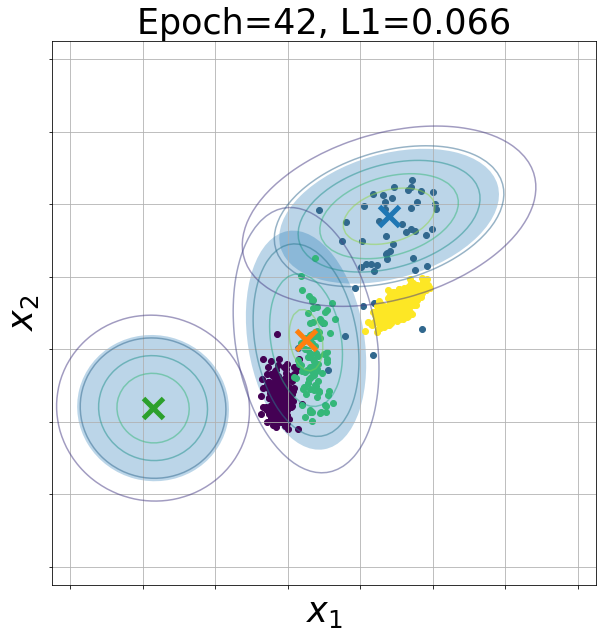

[test_gmnet_2D] [Epoch=042] Train Loss=[QuantLoss=0.06635]Val loss = [QuantLoss=0.06635][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 43...
[test_gmnet_2D] Elapsed training time:0.46s
Means:
Parameter containing:
tensor([[0.6676, 0.7762],
        [0.4527, 0.4247],
        [0.0373, 0.2446]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

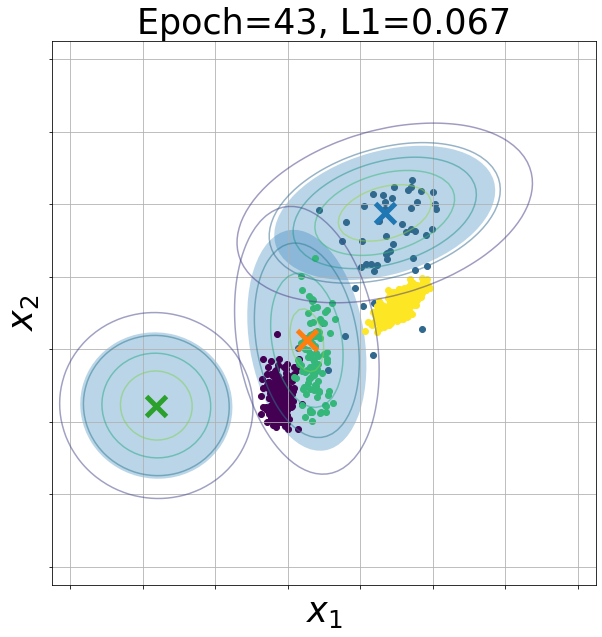

[test_gmnet_2D] [Epoch=043] Train Loss=[QuantLoss=0.06706]Val loss = [QuantLoss=0.06706]
[test_gmnet_2D] Starting epoch 44...
[test_gmnet_2D] Elapsed training time:0.39s
Means:
Parameter containing:
tensor([[0.6675, 0.7730],
        [0.4461, 0.4188],
        [0.0483, 0.2344]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

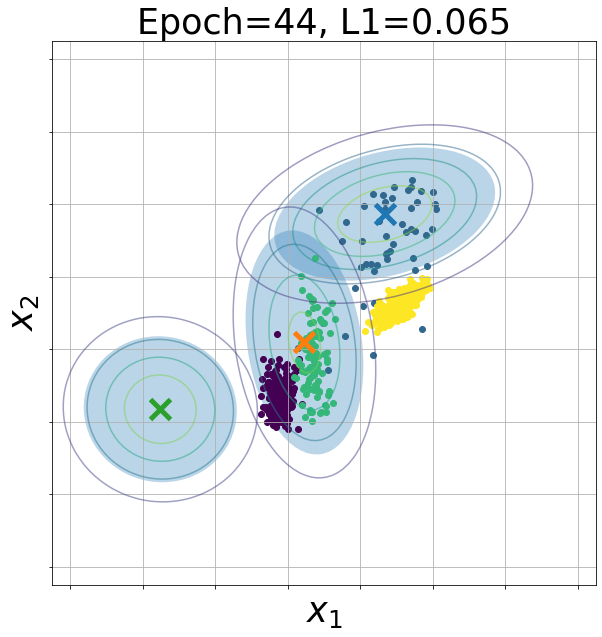

[test_gmnet_2D] [Epoch=044] Train Loss=[QuantLoss=0.06510]Val loss = [QuantLoss=0.06510][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 45...
[test_gmnet_2D] Elapsed training time:0.63s
Means:
Parameter containing:
tensor([[0.6757, 0.7674],
        [0.4538, 0.4215],
        [0.0621, 0.2472]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

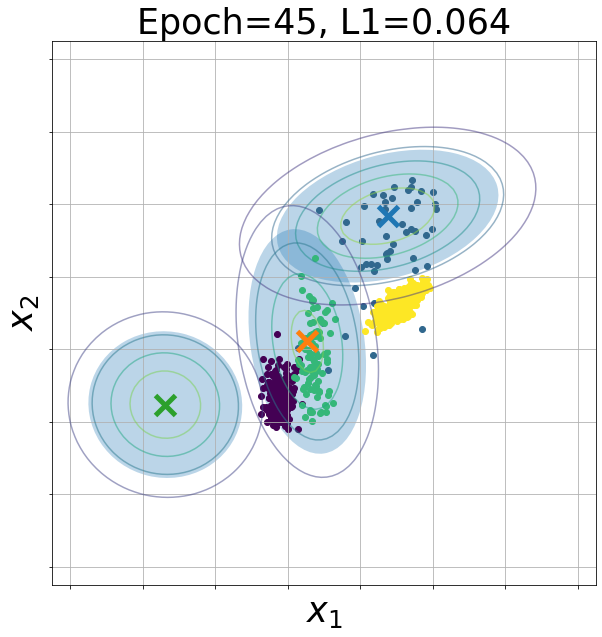

[test_gmnet_2D] [Epoch=045] Train Loss=[QuantLoss=0.06384]Val loss = [QuantLoss=0.06384][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 46...
[test_gmnet_2D] Elapsed training time:0.30s
Means:
Parameter containing:
tensor([[0.6722, 0.7752],
        [0.4476, 0.4134],
        [0.0785, 0.2526]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

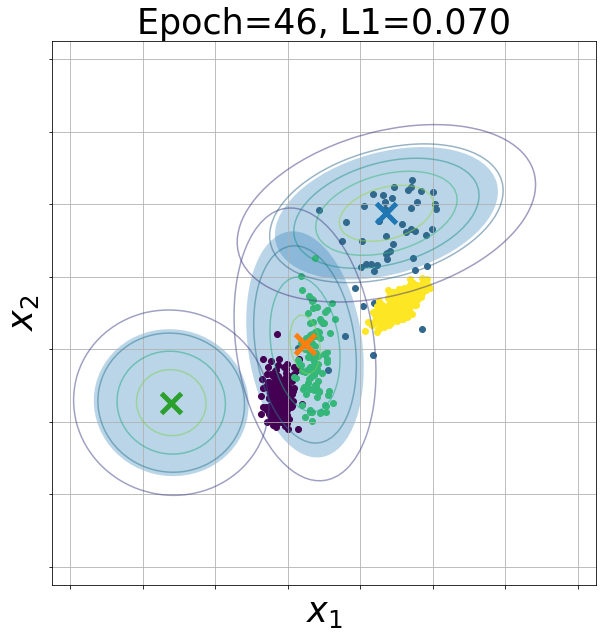

[test_gmnet_2D] [Epoch=046] Train Loss=[QuantLoss=0.07017]Val loss = [QuantLoss=0.07017]
[test_gmnet_2D] Starting epoch 47...
[test_gmnet_2D] Elapsed training time:0.34s
Means:
Parameter containing:
tensor([[0.6768, 0.7706],
        [0.4565, 0.4155],
        [0.0733, 0.2469]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

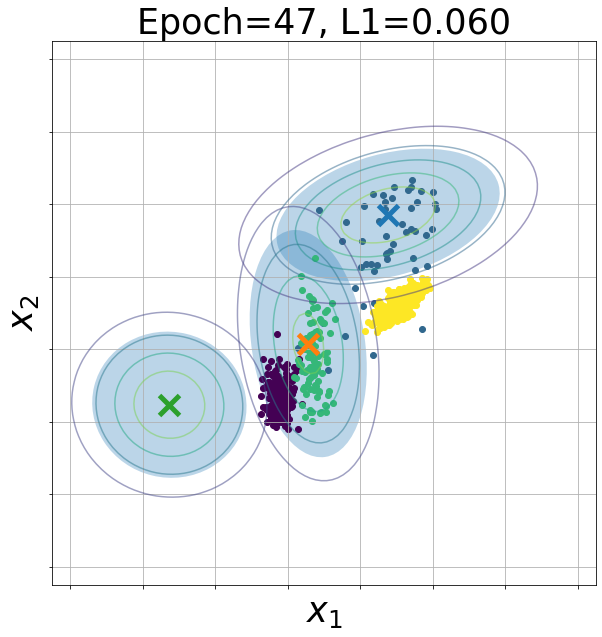

[test_gmnet_2D] [Epoch=047] Train Loss=[QuantLoss=0.06014]Val loss = [QuantLoss=0.06014][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 48...
[test_gmnet_2D] Elapsed training time:0.43s
Means:
Parameter containing:
tensor([[0.6716, 0.7752],
        [0.4582, 0.4114],
        [0.0757, 0.2485]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

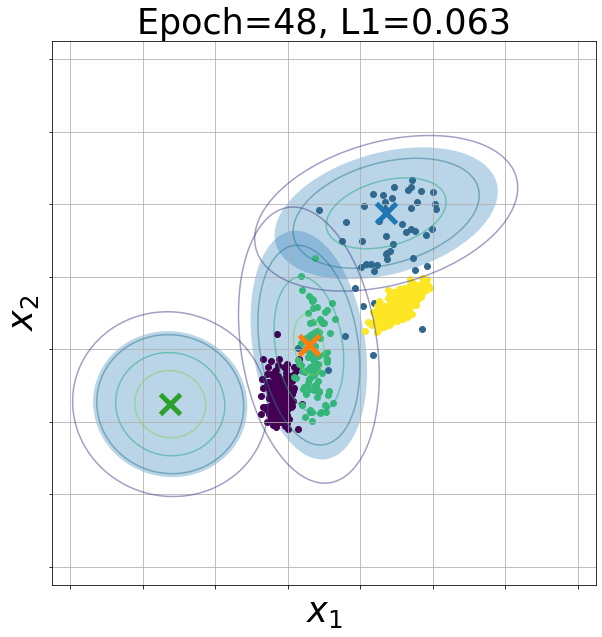

[test_gmnet_2D] [Epoch=048] Train Loss=[QuantLoss=0.06331]Val loss = [QuantLoss=0.06331]
[test_gmnet_2D] Starting epoch 49...
[test_gmnet_2D] Elapsed training time:0.41s
Means:
Parameter containing:
tensor([[0.6740, 0.7697],
        [0.4565, 0.4093],
        [0.0779, 0.2532]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

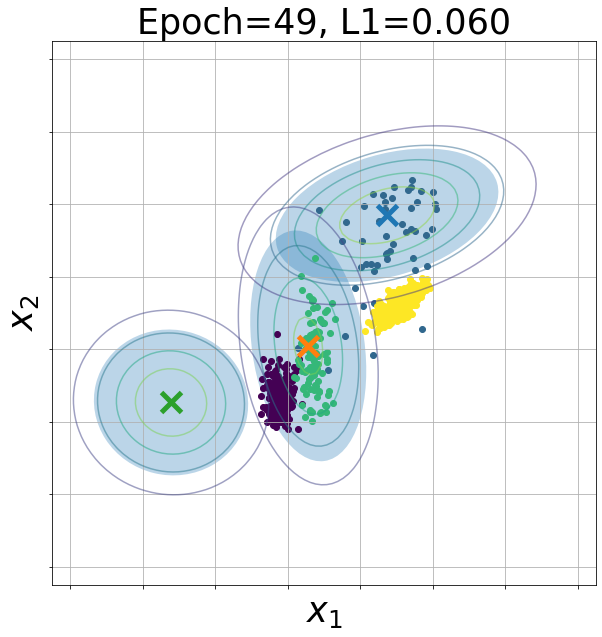

[test_gmnet_2D] [Epoch=049] Train Loss=[QuantLoss=0.05959]Val loss = [QuantLoss=0.05959][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 50...
[test_gmnet_2D] Elapsed training time:0.40s
Means:
Parameter containing:
tensor([[0.6777, 0.7646],
        [0.4571, 0.4092],
        [0.0854, 0.2685]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

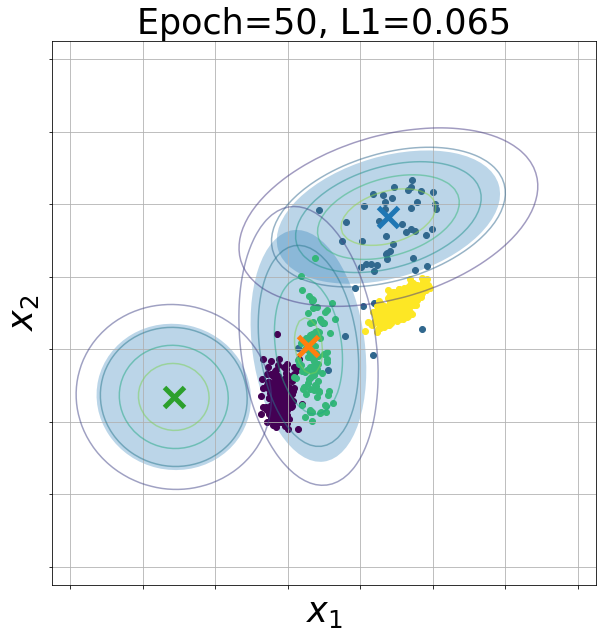

[test_gmnet_2D] [Epoch=050] Train Loss=[QuantLoss=0.06523]Val loss = [QuantLoss=0.06523]
[test_gmnet_2D] Starting epoch 51...
[test_gmnet_2D] Elapsed training time:0.40s
Means:
Parameter containing:
tensor([[0.6824, 0.7722],
        [0.4565, 0.4053],
        [0.0969, 0.2704]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

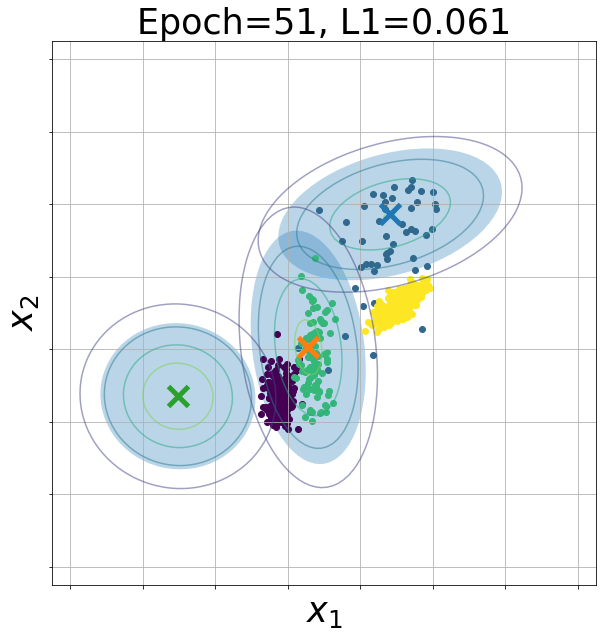

[test_gmnet_2D] [Epoch=051] Train Loss=[QuantLoss=0.06134]Val loss = [QuantLoss=0.06134]
[test_gmnet_2D] Starting epoch 52...
[test_gmnet_2D] Elapsed training time:0.40s
Means:
Parameter containing:
tensor([[0.6853, 0.7690],
        [0.4552, 0.3994],
        [0.1035, 0.2644]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

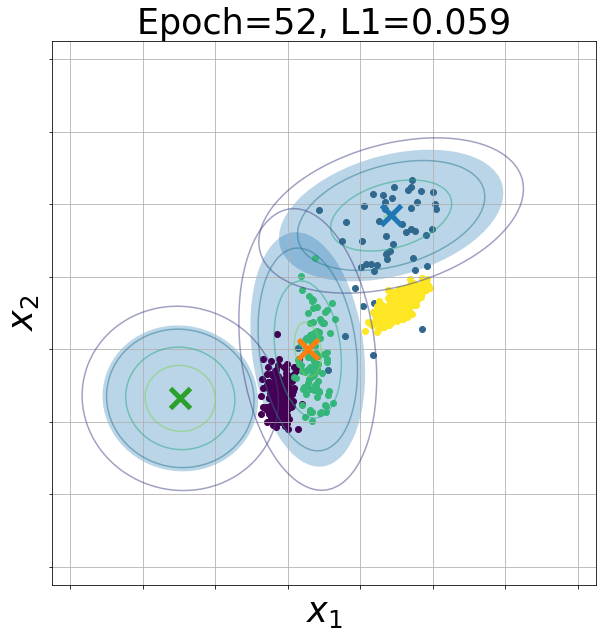

[test_gmnet_2D] [Epoch=052] Train Loss=[QuantLoss=0.05947]Val loss = [QuantLoss=0.05947][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 53...
[test_gmnet_2D] Elapsed training time:0.39s
Means:
Parameter containing:
tensor([[0.6818, 0.7691],
        [0.4610, 0.4021],
        [0.1057, 0.2588]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

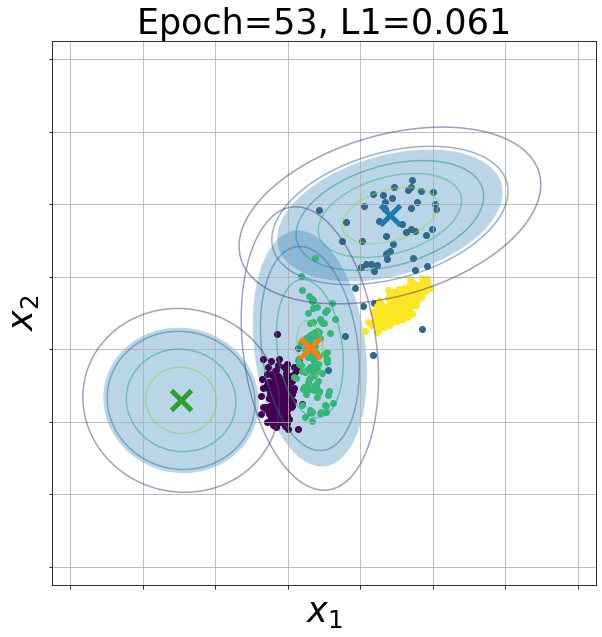

[test_gmnet_2D] [Epoch=053] Train Loss=[QuantLoss=0.06084]Val loss = [QuantLoss=0.06084]
[test_gmnet_2D] Starting epoch 54...
[test_gmnet_2D] Elapsed training time:0.43s
Means:
Parameter containing:
tensor([[0.6811, 0.7700],
        [0.4604, 0.3942],
        [0.1083, 0.2525]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

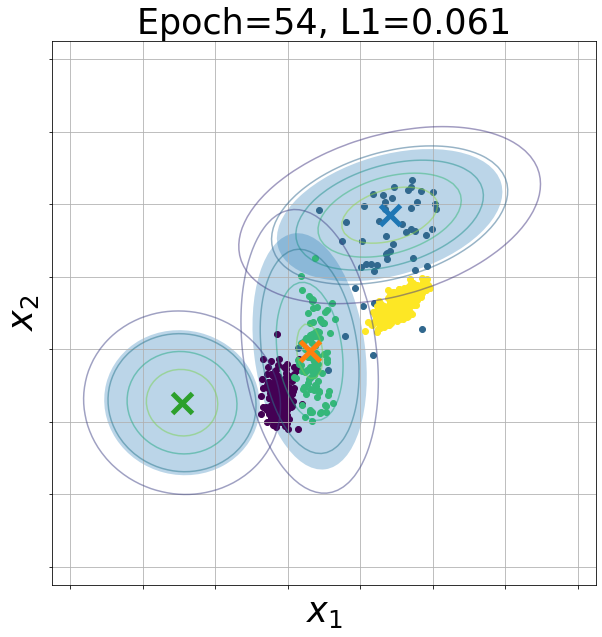

[test_gmnet_2D] [Epoch=054] Train Loss=[QuantLoss=0.06058]Val loss = [QuantLoss=0.06058]
[test_gmnet_2D] Starting epoch 55...
[test_gmnet_2D] Elapsed training time:0.47s
Means:
Parameter containing:
tensor([[0.6837, 0.7663],
        [0.4577, 0.3868],
        [0.1251, 0.2497]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

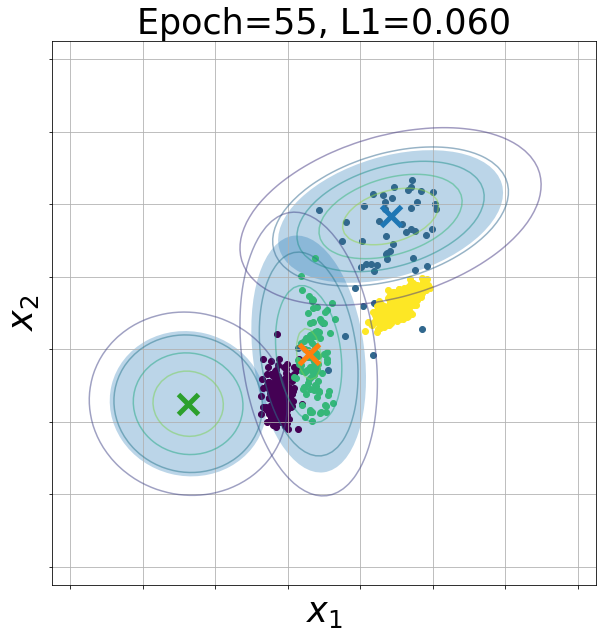

[test_gmnet_2D] [Epoch=055] Train Loss=[QuantLoss=0.05996]Val loss = [QuantLoss=0.05996]
[test_gmnet_2D] Starting epoch 56...
[test_gmnet_2D] Elapsed training time:0.44s
Means:
Parameter containing:
tensor([[0.6814, 0.7661],
        [0.4640, 0.3910],
        [0.1415, 0.2608]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

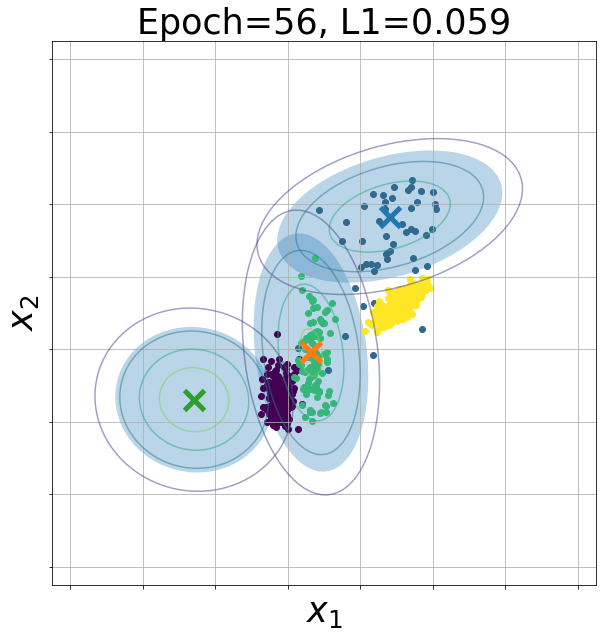

[test_gmnet_2D] [Epoch=056] Train Loss=[QuantLoss=0.05879]Val loss = [QuantLoss=0.05879][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 57...
[test_gmnet_2D] Elapsed training time:0.33s
Means:
Parameter containing:
tensor([[0.6757, 0.7617],
        [0.4596, 0.3856],
        [0.1424, 0.2679]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

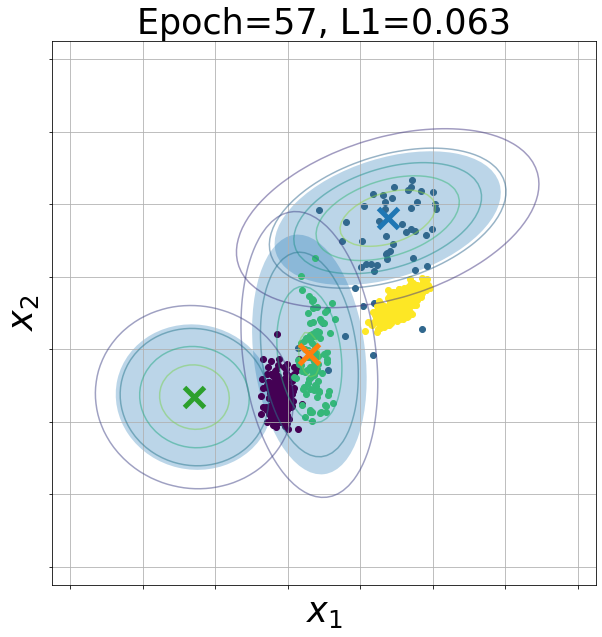

[test_gmnet_2D] [Epoch=057] Train Loss=[QuantLoss=0.06305]Val loss = [QuantLoss=0.06305]
[test_gmnet_2D] Starting epoch 58...
[test_gmnet_2D] Elapsed training time:0.43s
Means:
Parameter containing:
tensor([[0.6730, 0.7609],
        [0.4597, 0.3810],
        [0.1418, 0.2683]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

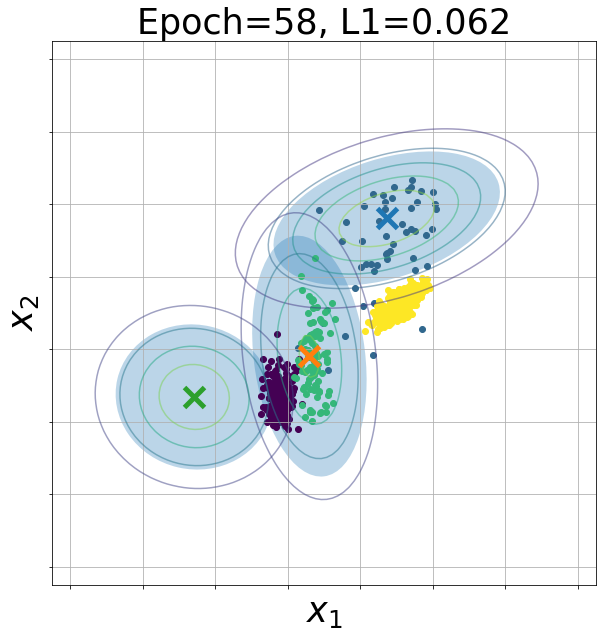

[test_gmnet_2D] [Epoch=058] Train Loss=[QuantLoss=0.06234]Val loss = [QuantLoss=0.06234]
[test_gmnet_2D] Starting epoch 59...
[test_gmnet_2D] Elapsed training time:0.38s
Means:
Parameter containing:
tensor([[0.6744, 0.7621],
        [0.4644, 0.3840],
        [0.1432, 0.2665]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

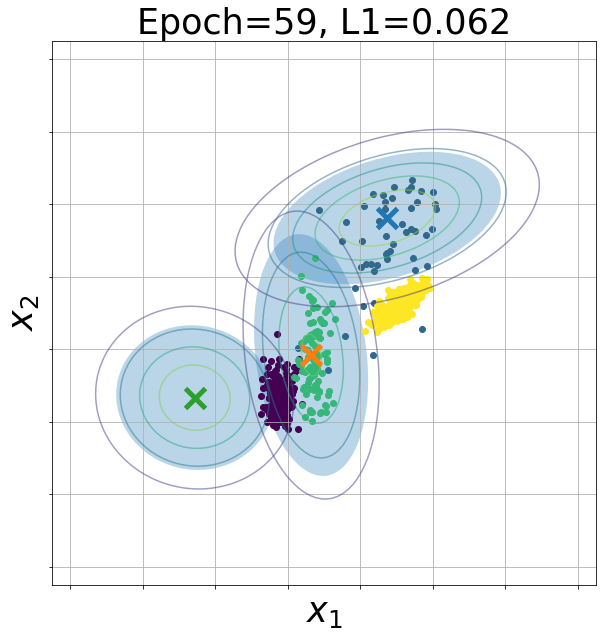

[test_gmnet_2D] [Epoch=059] Train Loss=[QuantLoss=0.06169]Val loss = [QuantLoss=0.06169]
[test_gmnet_2D] Starting epoch 60...
[test_gmnet_2D] Elapsed training time:0.41s
Means:
Parameter containing:
tensor([[0.6842, 0.7593],
        [0.4600, 0.3759],
        [0.1365, 0.2626]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

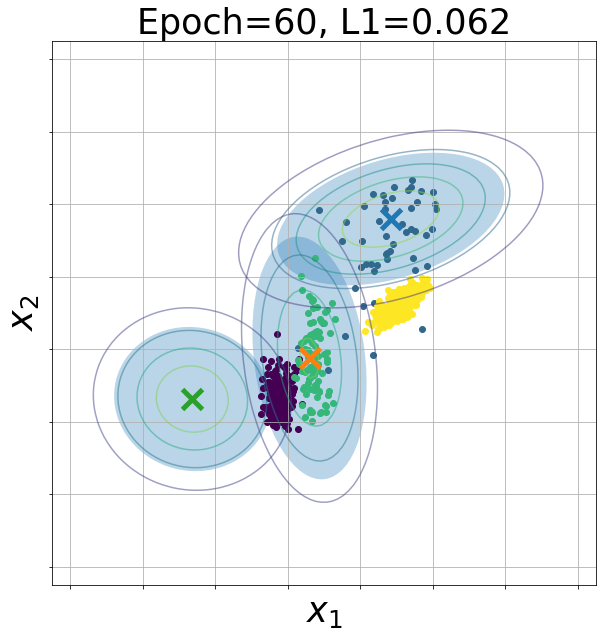

[test_gmnet_2D] [Epoch=060] Train Loss=[QuantLoss=0.06158]Val loss = [QuantLoss=0.06158]
[test_gmnet_2D] Starting epoch 61...
[test_gmnet_2D] Elapsed training time:0.45s
Means:
Parameter containing:
tensor([[0.6781, 0.7681],
        [0.4641, 0.3765],
        [0.1451, 0.2662]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

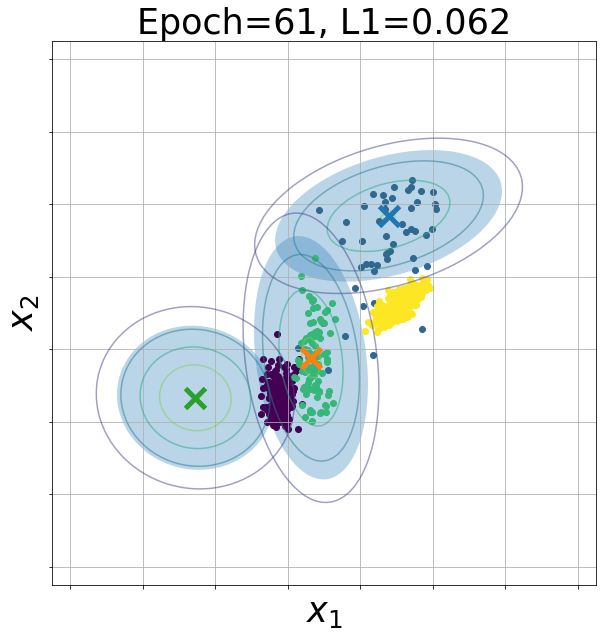

[test_gmnet_2D] [Epoch=061] Train Loss=[QuantLoss=0.06161]Val loss = [QuantLoss=0.06161]
[test_gmnet_2D] Starting epoch 62...
[test_gmnet_2D] Elapsed training time:0.31s
Means:
Parameter containing:
tensor([[0.6793, 0.7612],
        [0.4643, 0.3740],
        [0.1409, 0.2699]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

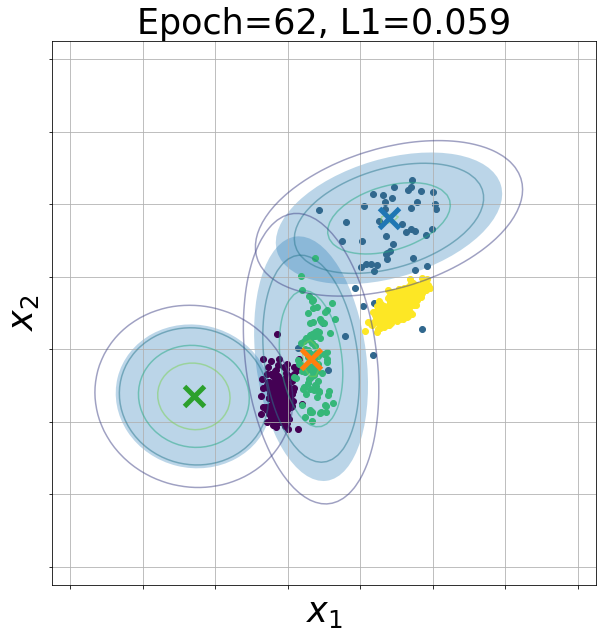

[test_gmnet_2D] [Epoch=062] Train Loss=[QuantLoss=0.05908]Val loss = [QuantLoss=0.05908]
[test_gmnet_2D] Starting epoch 63...
[test_gmnet_2D] Elapsed training time:0.34s
Means:
Parameter containing:
tensor([[0.6773, 0.7514],
        [0.4606, 0.3677],
        [0.1368, 0.2636]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

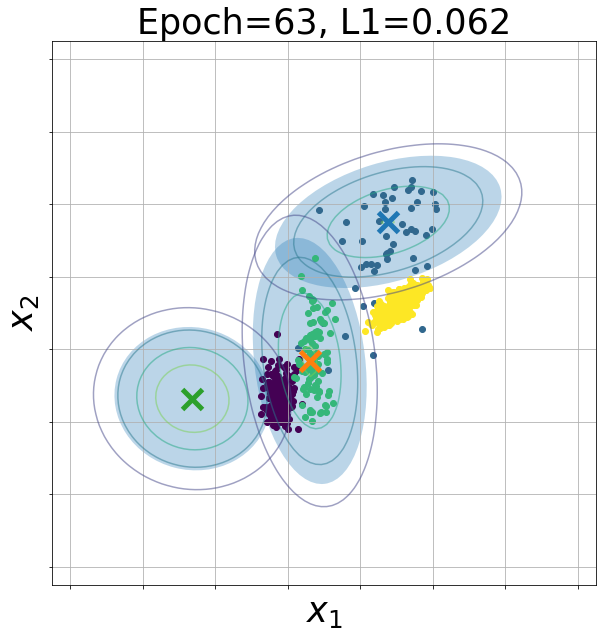

[test_gmnet_2D] [Epoch=063] Train Loss=[QuantLoss=0.06212]Val loss = [QuantLoss=0.06212]
[test_gmnet_2D] Starting epoch 64...
[test_gmnet_2D] Elapsed training time:0.31s
Means:
Parameter containing:
tensor([[0.6693, 0.7531],
        [0.4717, 0.3743],
        [0.1568, 0.2693]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

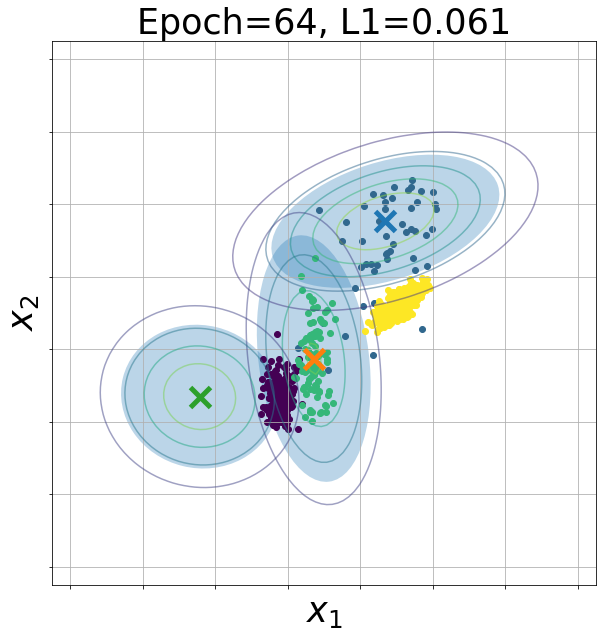

[test_gmnet_2D] [Epoch=064] Train Loss=[QuantLoss=0.06080]Val loss = [QuantLoss=0.06080]
[test_gmnet_2D] Starting epoch 65...
[test_gmnet_2D] Elapsed training time:0.42s
Means:
Parameter containing:
tensor([[0.6682, 0.7549],
        [0.4662, 0.3664],
        [0.1471, 0.2607]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

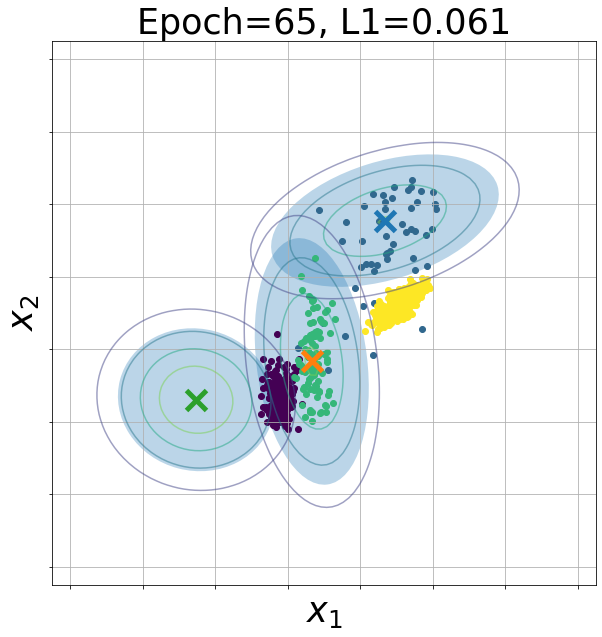

[test_gmnet_2D] [Epoch=065] Train Loss=[QuantLoss=0.06051]Val loss = [QuantLoss=0.06051]
[test_gmnet_2D] Starting epoch 66...
[test_gmnet_2D] Elapsed training time:0.40s
Means:
Parameter containing:
tensor([[0.6643, 0.7583],
        [0.4685, 0.3616],
        [0.1596, 0.2670]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

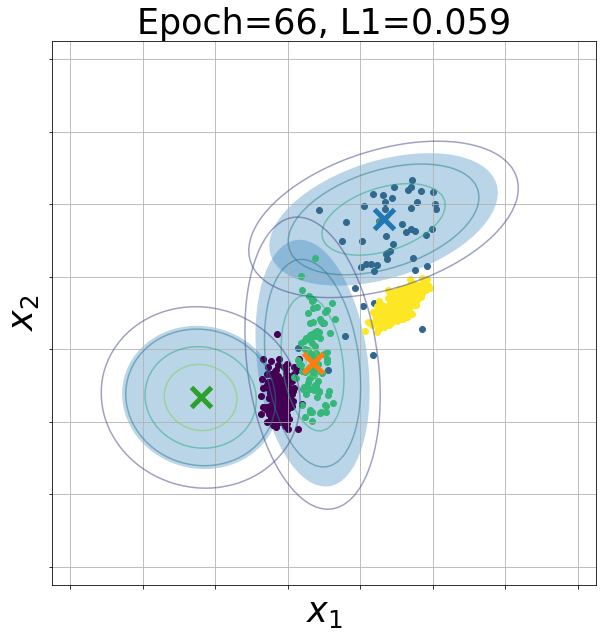

[test_gmnet_2D] [Epoch=066] Train Loss=[QuantLoss=0.05916]Val loss = [QuantLoss=0.05916]
[test_gmnet_2D] Starting epoch 67...
[test_gmnet_2D] Elapsed training time:0.36s
Means:
Parameter containing:
tensor([[0.6628, 0.7582],
        [0.4658, 0.3569],
        [0.1644, 0.2684]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

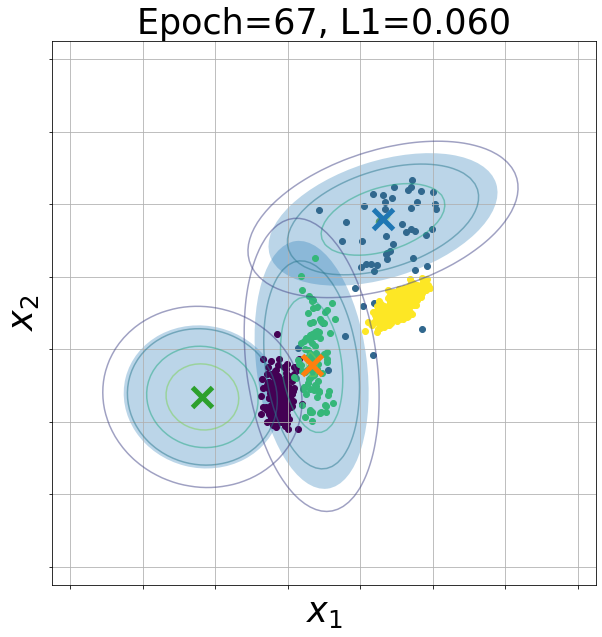

[test_gmnet_2D] [Epoch=067] Train Loss=[QuantLoss=0.05963]Val loss = [QuantLoss=0.05963]
[test_gmnet_2D] Starting epoch 68...
[test_gmnet_2D] Elapsed training time:0.36s
Means:
Parameter containing:
tensor([[0.6573, 0.7611],
        [0.4688, 0.3565],
        [0.1637, 0.2613]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

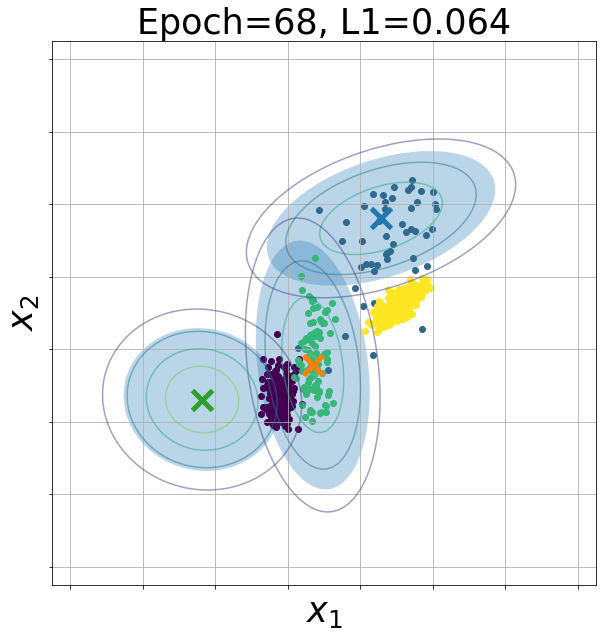

[test_gmnet_2D] [Epoch=068] Train Loss=[QuantLoss=0.06409]Val loss = [QuantLoss=0.06409]
[test_gmnet_2D] Starting epoch 69...
[test_gmnet_2D] Elapsed training time:0.35s
Means:
Parameter containing:
tensor([[0.6589, 0.7581],
        [0.4635, 0.3526],
        [0.1655, 0.2639]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

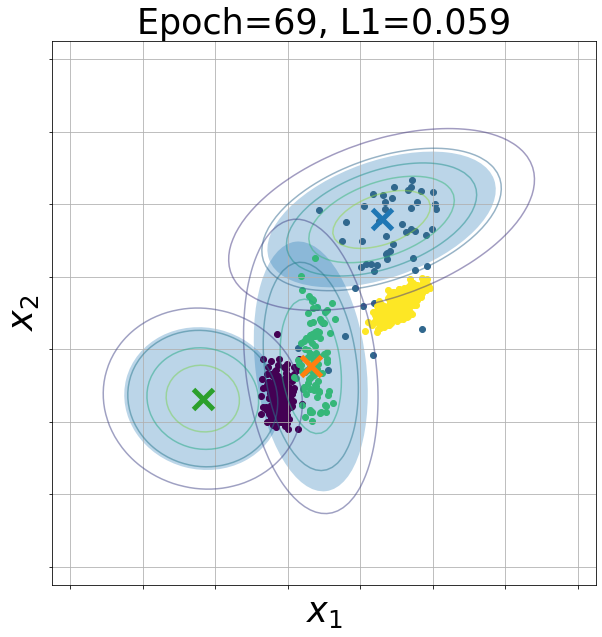

[test_gmnet_2D] [Epoch=069] Train Loss=[QuantLoss=0.05861]Val loss = [QuantLoss=0.05861][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 70...
[test_gmnet_2D] Elapsed training time:0.76s
Means:
Parameter containing:
tensor([[0.6692, 0.7544],
        [0.4661, 0.3494],
        [0.1717, 0.2727]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

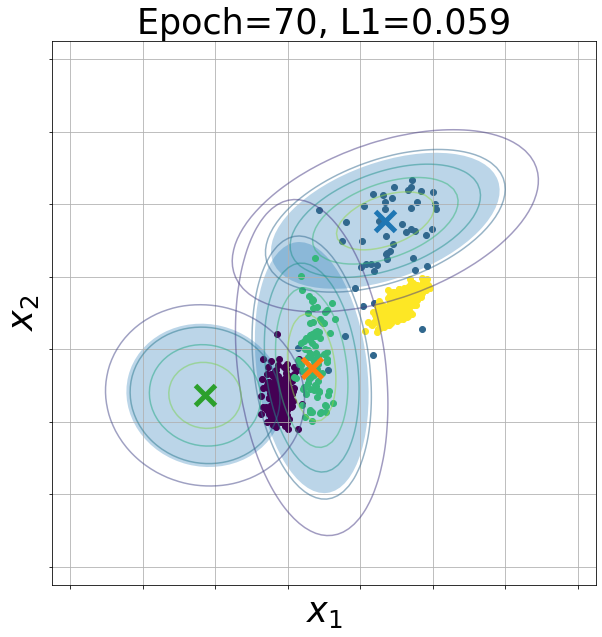

[test_gmnet_2D] [Epoch=070] Train Loss=[QuantLoss=0.05882]Val loss = [QuantLoss=0.05882]
[test_gmnet_2D] Starting epoch 71...
[test_gmnet_2D] Elapsed training time:0.38s
Means:
Parameter containing:
tensor([[0.6650, 0.7617],
        [0.4684, 0.3520],
        [0.1658, 0.2577]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

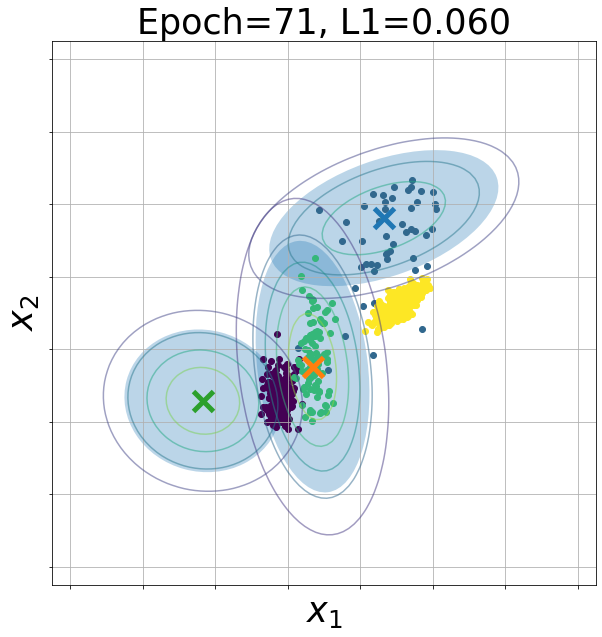

[test_gmnet_2D] [Epoch=071] Train Loss=[QuantLoss=0.05962]Val loss = [QuantLoss=0.05962]
[test_gmnet_2D] Starting epoch 72...
[test_gmnet_2D] Elapsed training time:0.39s
Means:
Parameter containing:
tensor([[0.6649, 0.7572],
        [0.4646, 0.3518],
        [0.1796, 0.2678]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

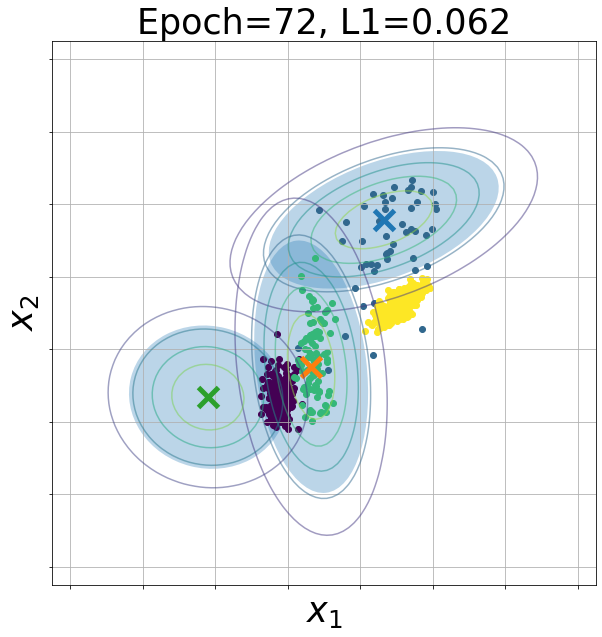

[test_gmnet_2D] [Epoch=072] Train Loss=[QuantLoss=0.06161]Val loss = [QuantLoss=0.06161]
[test_gmnet_2D] Starting epoch 73...
[test_gmnet_2D] Elapsed training time:0.38s
Means:
Parameter containing:
tensor([[0.6680, 0.7584],
        [0.4664, 0.3511],
        [0.1765, 0.2597]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

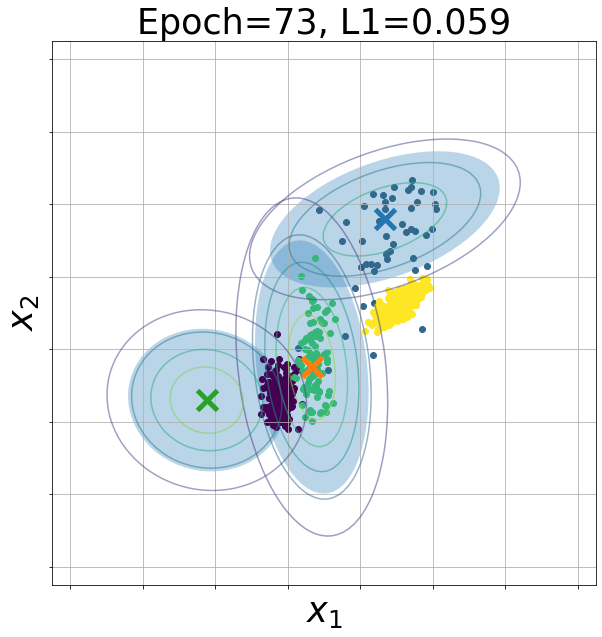

[test_gmnet_2D] [Epoch=073] Train Loss=[QuantLoss=0.05911]Val loss = [QuantLoss=0.05911]
[test_gmnet_2D] Starting epoch 74...
[test_gmnet_2D] Elapsed training time:0.58s
Means:
Parameter containing:
tensor([[0.6688, 0.7563],
        [0.4711, 0.3554],
        [0.1646, 0.2570]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

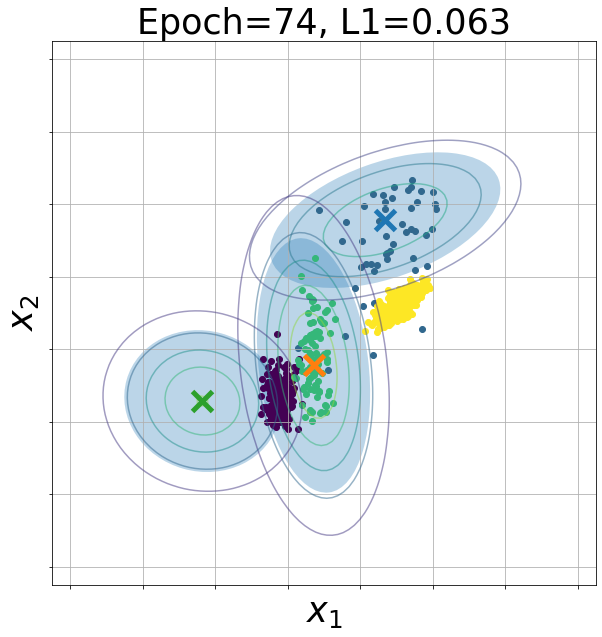

[test_gmnet_2D] [Epoch=074] Train Loss=[QuantLoss=0.06265]Val loss = [QuantLoss=0.06265]
[test_gmnet_2D] Starting epoch 75...
[test_gmnet_2D] Elapsed training time:0.60s
Means:
Parameter containing:
tensor([[0.6734, 0.7542],
        [0.4674, 0.3533],
        [0.1795, 0.2728]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

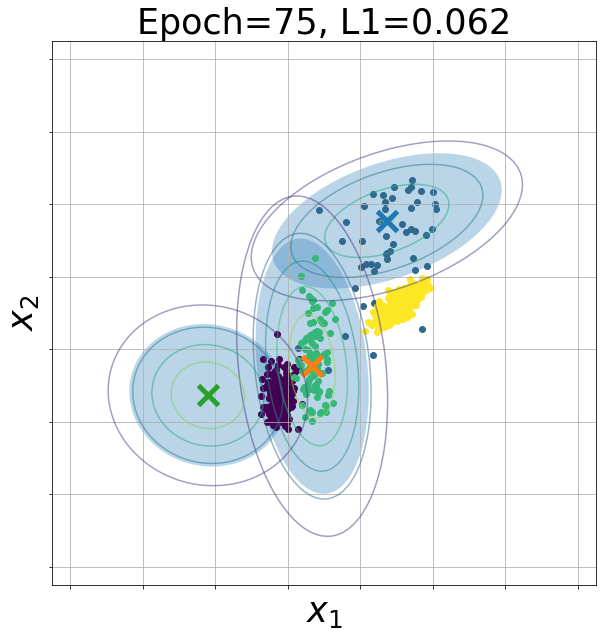

[test_gmnet_2D] [Epoch=075] Train Loss=[QuantLoss=0.06201]Val loss = [QuantLoss=0.06201]
[test_gmnet_2D] Starting epoch 76...
[test_gmnet_2D] Elapsed training time:0.34s
Means:
Parameter containing:
tensor([[0.6708, 0.7519],
        [0.4621, 0.3484],
        [0.1831, 0.2727]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

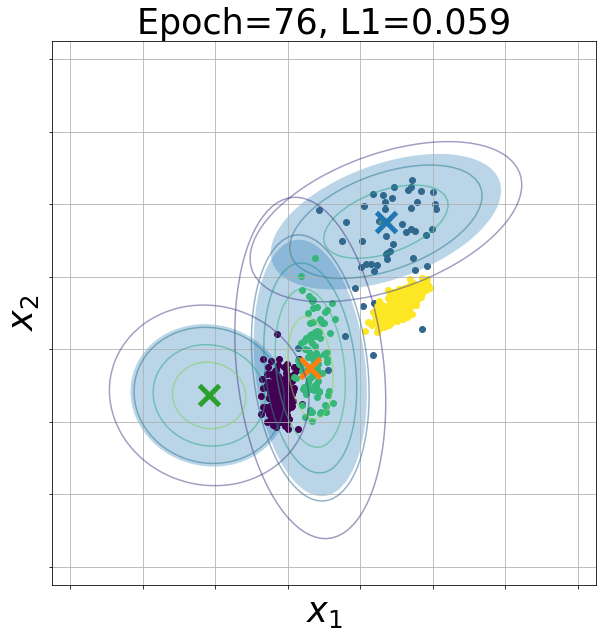

[test_gmnet_2D] [Epoch=076] Train Loss=[QuantLoss=0.05932]Val loss = [QuantLoss=0.05932]
[test_gmnet_2D] Starting epoch 77...
[test_gmnet_2D] Elapsed training time:0.61s
Means:
Parameter containing:
tensor([[0.6677, 0.7590],
        [0.4691, 0.3529],
        [0.1775, 0.2724]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

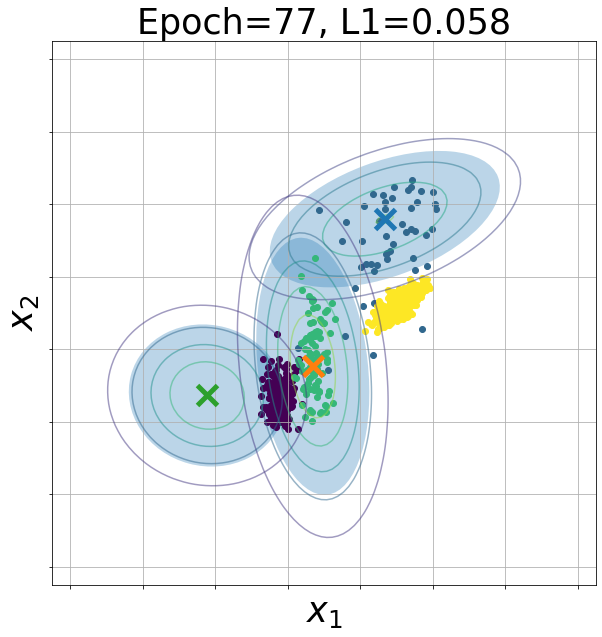

[test_gmnet_2D] [Epoch=077] Train Loss=[QuantLoss=0.05778]Val loss = [QuantLoss=0.05778][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 78...
[test_gmnet_2D] Elapsed training time:0.42s
Means:
Parameter containing:
tensor([[0.6695, 0.7587],
        [0.4662, 0.3501],
        [0.1856, 0.2702]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

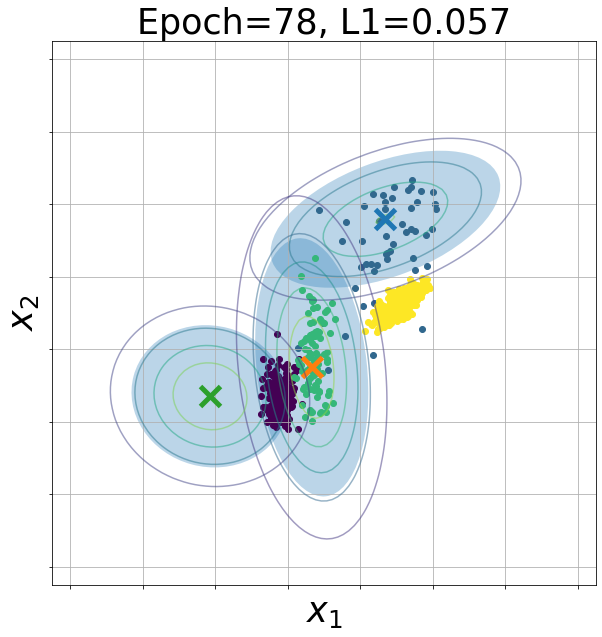

[test_gmnet_2D] [Epoch=078] Train Loss=[QuantLoss=0.05735]Val loss = [QuantLoss=0.05735][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 79...
[test_gmnet_2D] Elapsed training time:0.46s
Means:
Parameter containing:
tensor([[0.6780, 0.7497],
        [0.4662, 0.3474],
        [0.1947, 0.2723]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

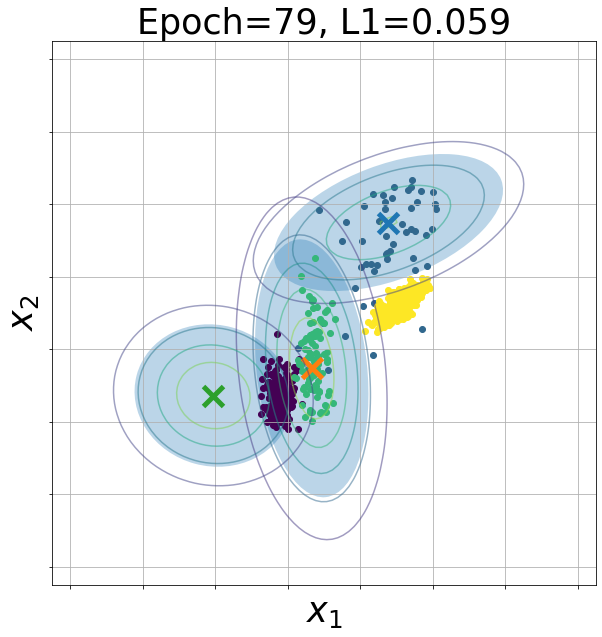

[test_gmnet_2D] [Epoch=079] Train Loss=[QuantLoss=0.05930]Val loss = [QuantLoss=0.05930]
[test_gmnet_2D] Starting epoch 80...
[test_gmnet_2D] Elapsed training time:1.41s
Means:
Parameter containing:
tensor([[0.6758, 0.7506],
        [0.4703, 0.3526],
        [0.1864, 0.2603]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

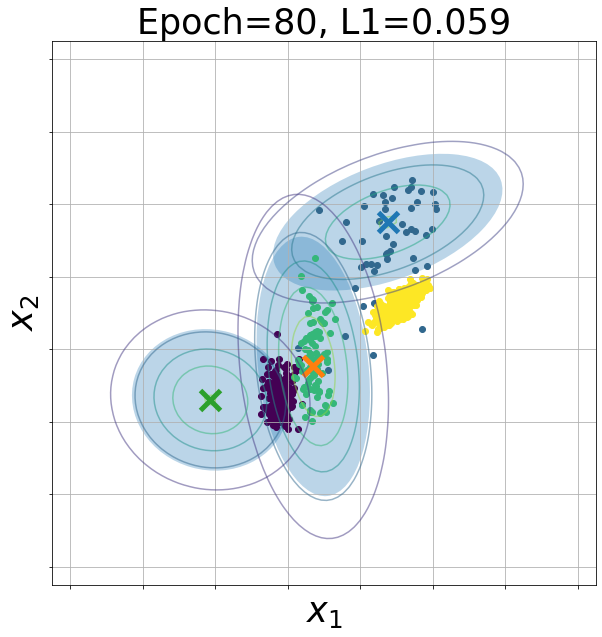

[test_gmnet_2D] [Epoch=080] Train Loss=[QuantLoss=0.05922]Val loss = [QuantLoss=0.05922]
[test_gmnet_2D] Starting epoch 81...
[test_gmnet_2D] Elapsed training time:0.66s
Means:
Parameter containing:
tensor([[0.6765, 0.7594],
        [0.4701, 0.3501],
        [0.1868, 0.2633]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

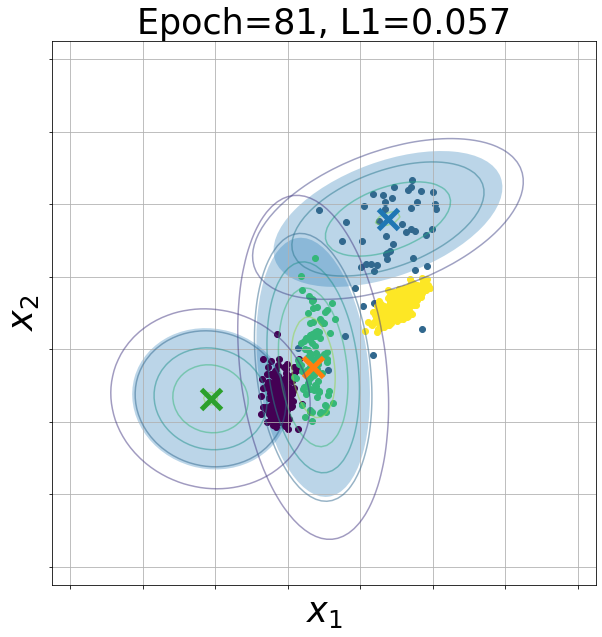

[test_gmnet_2D] [Epoch=081] Train Loss=[QuantLoss=0.05689]Val loss = [QuantLoss=0.05689][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 82...
[test_gmnet_2D] Elapsed training time:0.40s
Means:
Parameter containing:
tensor([[0.6741, 0.7577],
        [0.4696, 0.3479],
        [0.2039, 0.2725]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

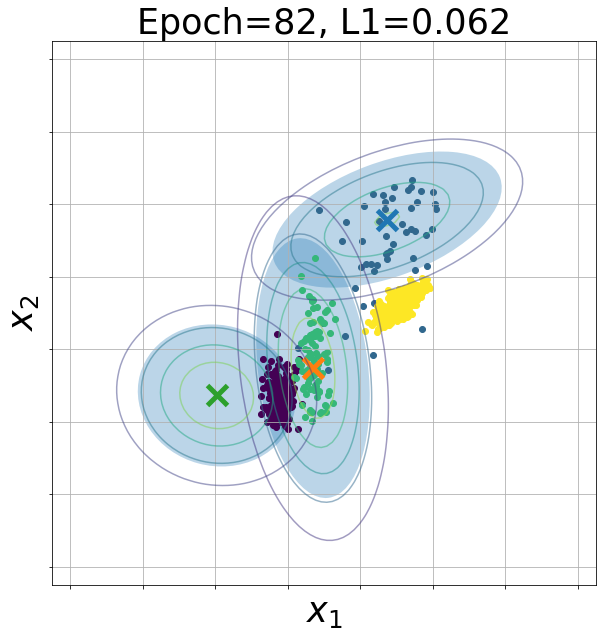

[test_gmnet_2D] [Epoch=082] Train Loss=[QuantLoss=0.06157]Val loss = [QuantLoss=0.06157]
[test_gmnet_2D] Starting epoch 83...
[test_gmnet_2D] Elapsed training time:0.41s
Means:
Parameter containing:
tensor([[0.6732, 0.7577],
        [0.4721, 0.3482],
        [0.1949, 0.2652]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

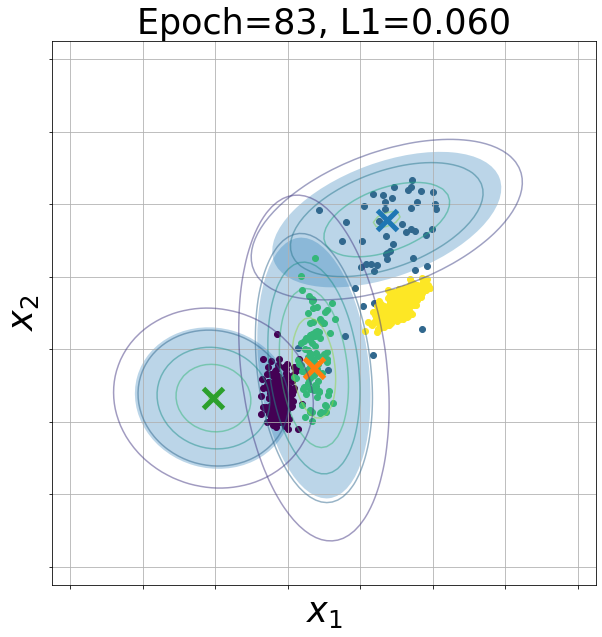

[test_gmnet_2D] [Epoch=083] Train Loss=[QuantLoss=0.05986]Val loss = [QuantLoss=0.05986]
[test_gmnet_2D] Starting epoch 84...
[test_gmnet_2D] Elapsed training time:0.36s
Means:
Parameter containing:
tensor([[0.6701, 0.7610],
        [0.4703, 0.3442],
        [0.1840, 0.2648]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

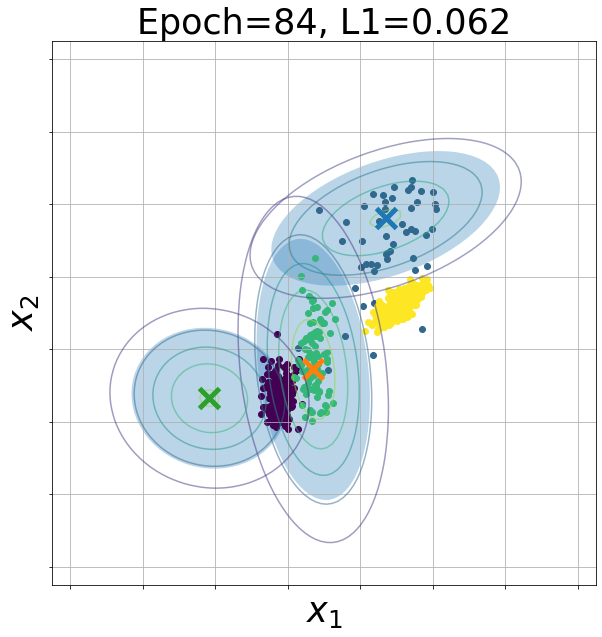

[test_gmnet_2D] [Epoch=084] Train Loss=[QuantLoss=0.06226]Val loss = [QuantLoss=0.06226]
[test_gmnet_2D] Starting epoch 85...
[test_gmnet_2D] Elapsed training time:0.48s
Means:
Parameter containing:
tensor([[0.6743, 0.7608],
        [0.4657, 0.3404],
        [0.1930, 0.2692]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

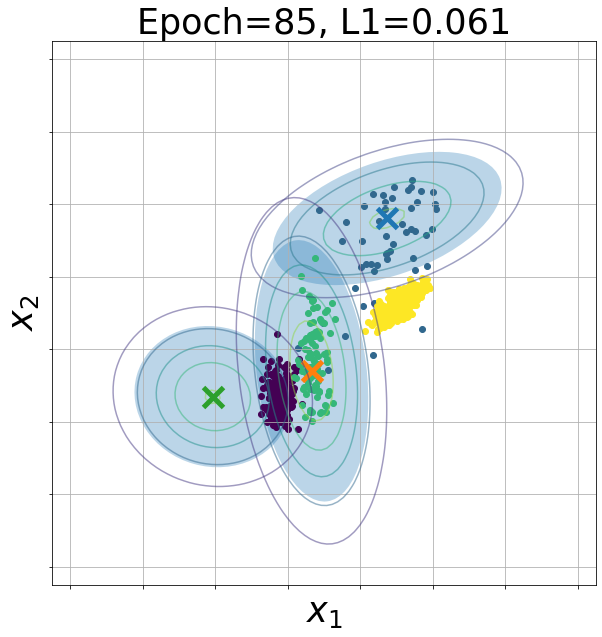

[test_gmnet_2D] [Epoch=085] Train Loss=[QuantLoss=0.06083]Val loss = [QuantLoss=0.06083]
[test_gmnet_2D] Starting epoch 86...
[test_gmnet_2D] Elapsed training time:0.39s
Means:
Parameter containing:
tensor([[0.6788, 0.7537],
        [0.4671, 0.3394],
        [0.1927, 0.2652]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

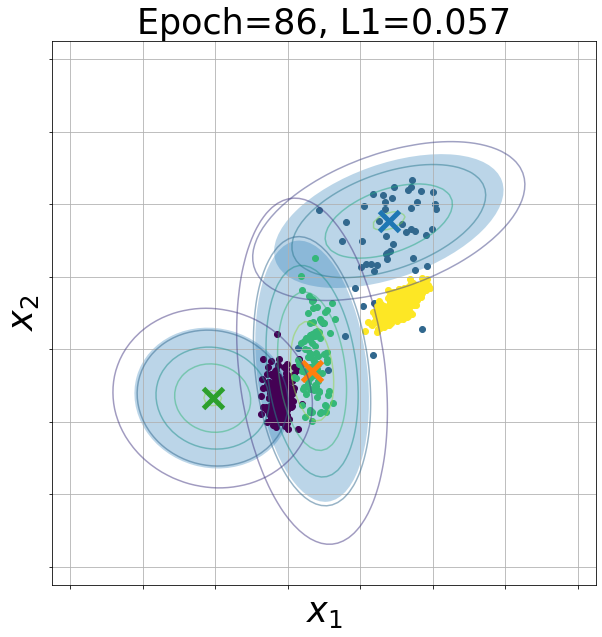

[test_gmnet_2D] [Epoch=086] Train Loss=[QuantLoss=0.05735]Val loss = [QuantLoss=0.05735]
[test_gmnet_2D] Starting epoch 87...
[test_gmnet_2D] Elapsed training time:0.37s
Means:
Parameter containing:
tensor([[0.6806, 0.7524],
        [0.4662, 0.3386],
        [0.1993, 0.2736]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

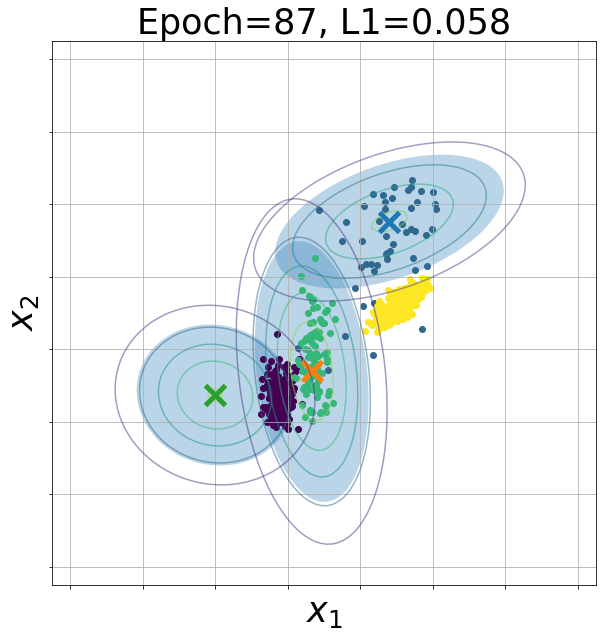

[test_gmnet_2D] [Epoch=087] Train Loss=[QuantLoss=0.05784]Val loss = [QuantLoss=0.05784]
[test_gmnet_2D] Starting epoch 88...
[test_gmnet_2D] Elapsed training time:0.37s
Means:
Parameter containing:
tensor([[0.6864, 0.7447],
        [0.4667, 0.3403],
        [0.1992, 0.2673]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

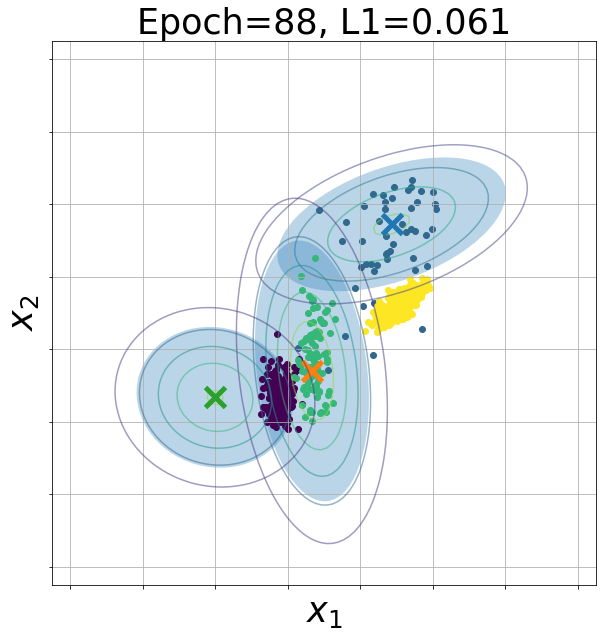

[test_gmnet_2D] [Epoch=088] Train Loss=[QuantLoss=0.06114]Val loss = [QuantLoss=0.06114]
[test_gmnet_2D] Starting epoch 89...
[test_gmnet_2D] Elapsed training time:0.63s
Means:
Parameter containing:
tensor([[0.6888, 0.7486],
        [0.4704, 0.3422],
        [0.2024, 0.2710]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

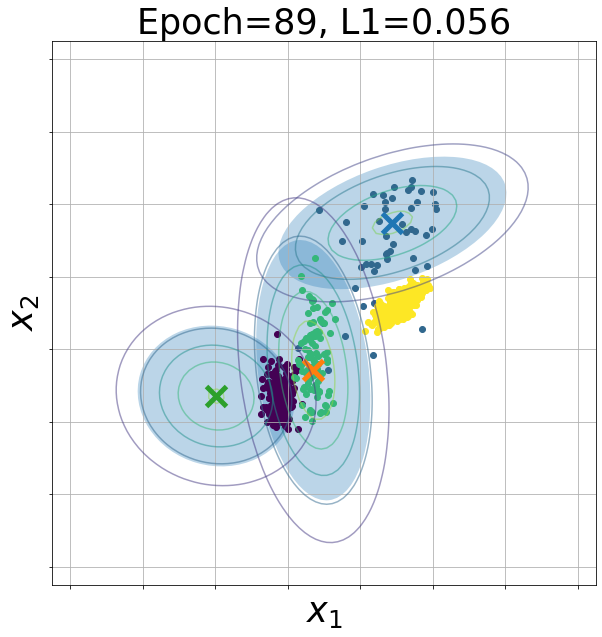

[test_gmnet_2D] [Epoch=089] Train Loss=[QuantLoss=0.05578]Val loss = [QuantLoss=0.05578][saved best model in this epoch]
[test_gmnet_2D] Starting epoch 90...
[test_gmnet_2D] Elapsed training time:0.40s
Means:
Parameter containing:
tensor([[0.6753, 0.7601],
        [0.4710, 0.3416],
        [0.1991, 0.2652]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

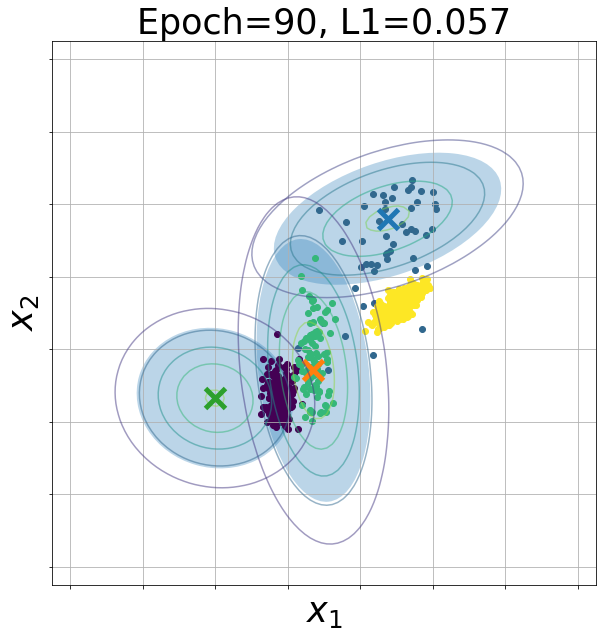

[test_gmnet_2D] [Epoch=090] Train Loss=[QuantLoss=0.05730]Val loss = [QuantLoss=0.05730]
[test_gmnet_2D] Starting epoch 91...
[test_gmnet_2D] Elapsed training time:0.41s
Means:
Parameter containing:
tensor([[0.6750, 0.7569],
        [0.4659, 0.3357],
        [0.1925, 0.2594]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

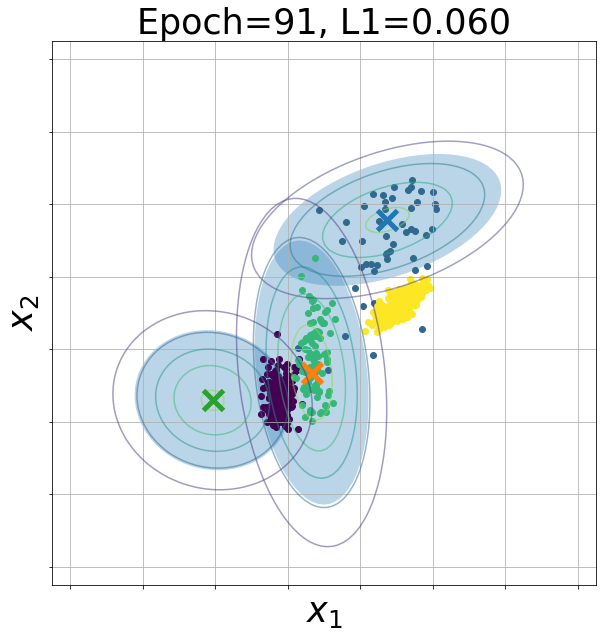

[test_gmnet_2D] [Epoch=091] Train Loss=[QuantLoss=0.06030]Val loss = [QuantLoss=0.06030]
[test_gmnet_2D] Starting epoch 92...
[test_gmnet_2D] Elapsed training time:0.49s
Means:
Parameter containing:
tensor([[0.6730, 0.7527],
        [0.4713, 0.3362],
        [0.1930, 0.2605]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

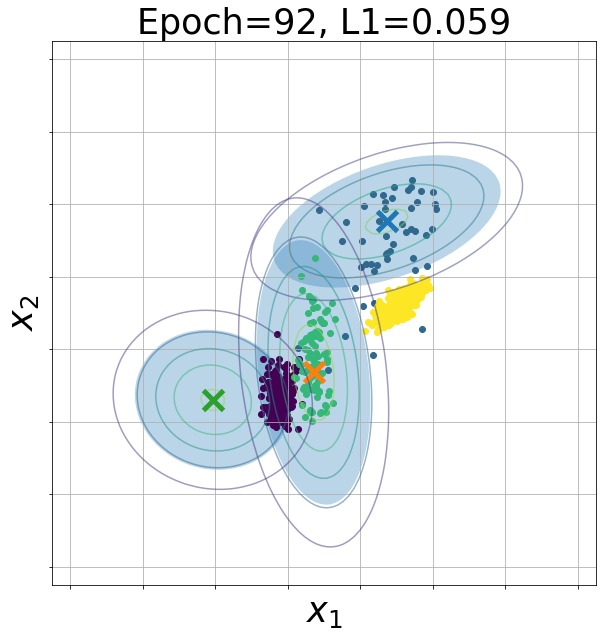

[test_gmnet_2D] [Epoch=092] Train Loss=[QuantLoss=0.05947]Val loss = [QuantLoss=0.05947]
[test_gmnet_2D] Starting epoch 93...
[test_gmnet_2D] Elapsed training time:0.42s
Means:
Parameter containing:
tensor([[0.6753, 0.7469],
        [0.4753, 0.3416],
        [0.1915, 0.2545]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

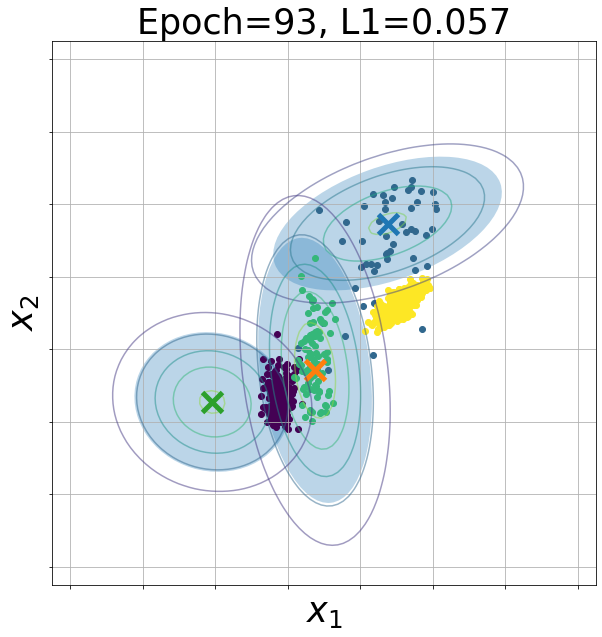

[test_gmnet_2D] [Epoch=093] Train Loss=[QuantLoss=0.05712]Val loss = [QuantLoss=0.05712]
[test_gmnet_2D] Starting epoch 94...
[test_gmnet_2D] Elapsed training time:0.39s
Means:
Parameter containing:
tensor([[0.6741, 0.7494],
        [0.4735, 0.3399],
        [0.2030, 0.2641]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

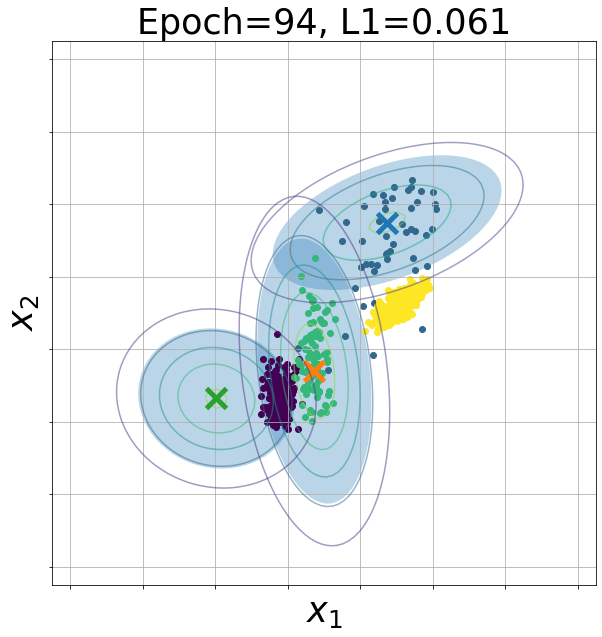

[test_gmnet_2D] [Epoch=094] Train Loss=[QuantLoss=0.06088]Val loss = [QuantLoss=0.06088]
[test_gmnet_2D] Starting epoch 95...
[test_gmnet_2D] Elapsed training time:0.40s
Means:
Parameter containing:
tensor([[0.6642, 0.7569],
        [0.4733, 0.3394],
        [0.2131, 0.2819]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

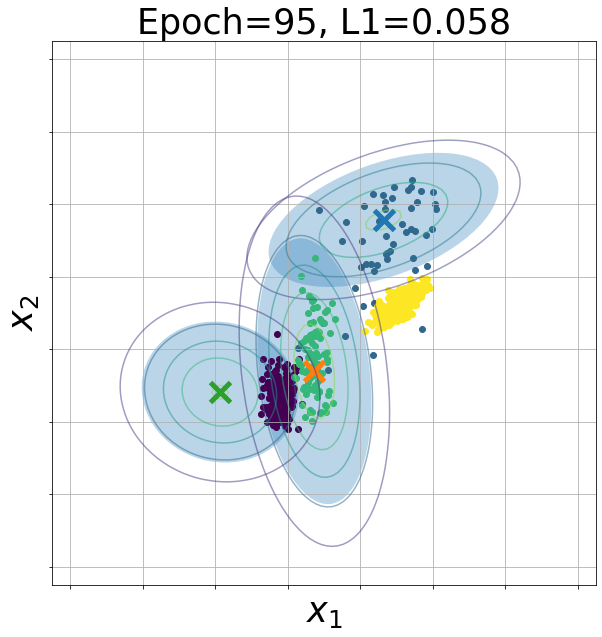

[test_gmnet_2D] [Epoch=095] Train Loss=[QuantLoss=0.05799]Val loss = [QuantLoss=0.05799]
[test_gmnet_2D] Starting epoch 96...
[test_gmnet_2D] Elapsed training time:0.38s
Means:
Parameter containing:
tensor([[0.6678, 0.7494],
        [0.4741, 0.3404],
        [0.2112, 0.2663]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

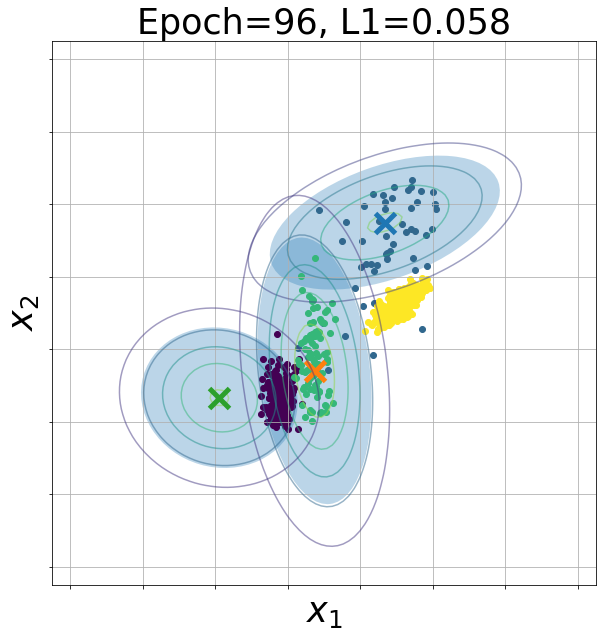

[test_gmnet_2D] [Epoch=096] Train Loss=[QuantLoss=0.05787]Val loss = [QuantLoss=0.05787]
[test_gmnet_2D] Starting epoch 97...
[test_gmnet_2D] Elapsed training time:0.39s
Means:
Parameter containing:
tensor([[0.6636, 0.7475],
        [0.4713, 0.3396],
        [0.2072, 0.2600]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

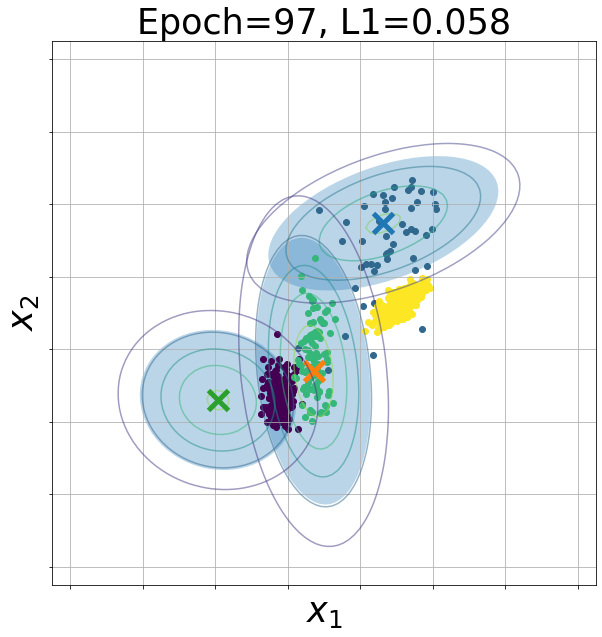

[test_gmnet_2D] [Epoch=097] Train Loss=[QuantLoss=0.05769]Val loss = [QuantLoss=0.05769]
[test_gmnet_2D] Starting epoch 98...
[test_gmnet_2D] Elapsed training time:0.38s
Means:
Parameter containing:
tensor([[0.6658, 0.7511],
        [0.4701, 0.3389],
        [0.2183, 0.2716]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

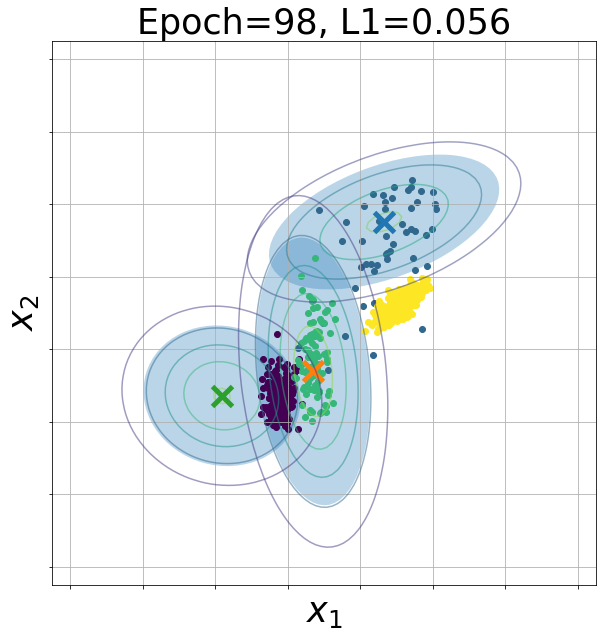

[test_gmnet_2D] [Epoch=098] Train Loss=[QuantLoss=0.05642]Val loss = [QuantLoss=0.05642]
[test_gmnet_2D] Starting epoch 99...
[test_gmnet_2D] Elapsed training time:0.36s
Means:
Parameter containing:
tensor([[0.6711, 0.7430],
        [0.4749, 0.3374],
        [0.2075, 0.2648]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

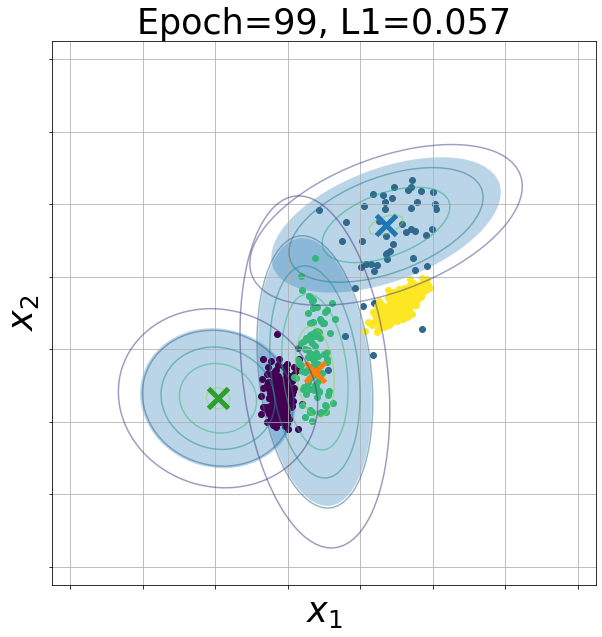

[test_gmnet_2D] [Epoch=099] Train Loss=[QuantLoss=0.05721]Val loss = [QuantLoss=0.05721]
[test_gmnet_2D] Starting epoch 100...
[test_gmnet_2D] Elapsed training time:0.36s
Means:
Parameter containing:
tensor([[0.6656, 0.7509],
        [0.4699, 0.3300],
        [0.2075, 0.2669]], requires_grad=True)


<Figure size 432x288 with 0 Axes>

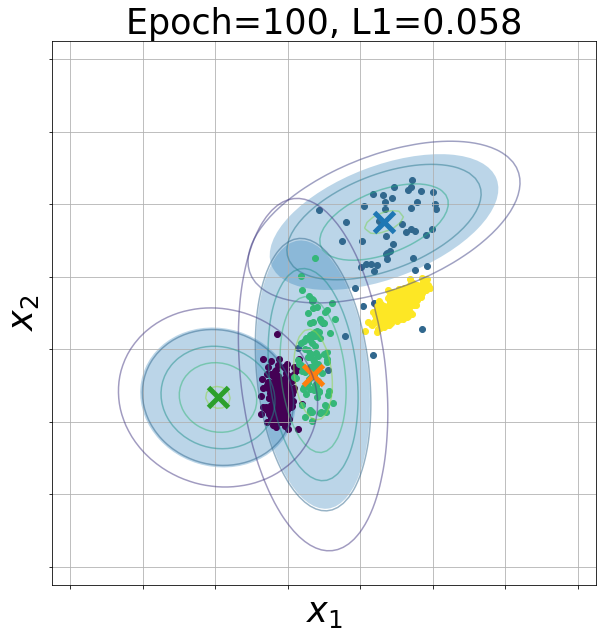

[test_gmnet_2D] [Epoch=100] Train Loss=[QuantLoss=0.05769]Val loss = [QuantLoss=0.05769]
[test_gmnet_2D] Restoring best model...


<Figure size 432x288 with 0 Axes>

In [5]:
from dlquantification.featureextraction.nofe import NoFeatureExtractionModule
from dlquantification.featureextraction.fullyconnected import FCFeatureExtractionModule
from dlquantification.gmnet import GMNet
from dlquantification.utils.utils import APPBagGenerator


device = torch.device("cpu")
fe = NoFeatureExtractionModule(input_size=2)
#fe = FCFeatureExtractionModule(input_size=2,output_size=2,hidden_sizes=[4])

gmnet = GMNet(
    train_epochs=101,
    test_epochs=1,
    n_classes=4,
    start_lr=0.001,
    end_lr=0.001,
    n_bags=500,
    bag_size=50,
    n_gm_layers=1,
    num_gaussians=[3],
    gaussian_dimensions=[None],
    random_seed=2032,
    linear_sizes=[4],
    feature_extraction_module=fe,
    bag_generator=APPBagGenerator(device=device),
    val_bag_generator=APPBagGenerator(device=device),
    batch_size=10,
    quant_loss=torch.nn.L1Loss(),
    lr_factor=0.2,
    patience=20,
    dropout=0,
    epsilon=0,
    weight_decay=0,
    use_labels=False,
    val_split=0,
    device=device,
    verbose=1,
    dataset_name="test_gmnet_2D",
)

def callback_epoch(val_loss, epoch):
    # print("Epoch %d validation loss: %f" % (epoch, val_loss))
    print("Means:")
    print(gmnet.model.quantmodule.gm_modules[0].gm_layer_0.centers)
    # print("Covariance matrix:")
    # print(gmnet.model.quantmodule.layers.gm_layer_0.covariance)
    
    plot_normal_distributions_with_dataset(gmnet.model.quantmodule.gm_modules[0].gm_layer_0.centers.detach(),gmnet.model.quantmodule.gm_modules[0].gm_layer_0.covariance.detach(),epoch, val_loss,dataset=dataset)

gmnet.callback_epoch = callback_epoch
print("Means:")
print(gmnet.model.quantmodule.gm_modules[0].gm_layer_0.centers)
gmnet.fit(dataset)
output_gif = 'output.gif'
create_gif(output_gif)